# Section 2
## Structuring Biomedical Data Using Networks 

- talk about features of biomedical datasets and the issues around working with them
 - heterogeneity of data types
 - outliers, noise, missing values
 - network construction decisions - filtering, kNN, similarity calulation - effects of different data modalities
 - introduce some of the key data types - transcriptomics, methylation etc.
 - introduce GenScot study and describe the data
- notebooks doing the initial processing of example data set(s) culminating with the GenScot set
- emerge from sessions with a selection of networks to work on later in the workshop

# Workshop Agenda: Working with TCGA Data and Network Analysis

## 1. Data Management
   - **1.1 Saving Data**: Techniques for efficient data storage.
   - **1.2 Loading Data**: Best practices for importing data.
   - **1.3 Data Cleaning**:
     - Checking for and handling missing data.
     - Outlier detection and remediation.
   - **1.4 Data Visualization**:
     - Creating metadata plots for basic analysis of patient numbers.
     - Evaluating features through simple plots.
   - **1.5 Assessing Data Quality**:
     - Checking for heterogeneity in the data.

## 2. Network Generation
   - **2.1 Correlation Matrix**: Construction and analysis.
   - **2.2 Data Preprocessing**:
     - Scaling and normalization.
     - Log transformation.
     - Analyzing variable distribution.
   - **2.3 Correlation Measures**:
     - Pearson, Spearman, and Euclidean correlations.
     - Absolute biweight midcorrelation.
     - Log-transformed Pearson correlation.
   - **2.4 Outputting the Adjacency Matrix**: From correlation to network structure.

## 3. Network Sparsification
   - **3.1 Thresholding Methods**:
     - Thresholding by degree.
     - Thresholding by closeness.
     - Thresholding by edge weight.
   - **3.2 k-Nearest Neighbors (KNN)**:
     - Basic KNN sparsification.
     - KNN combined with thresholding.
   - **3.3 Advanced Sparsification Techniques**:
     - Maximizing edge weight retention.
   - **3.4 Managing Graph Objects**:
     - Selecting the optimal graph representat

## TODO add SFARI genes as labels and show some visualization techniquesion for progressing to gene networks.

## 4. Types of Networks
   - **4.1 Gene Correlation Networks**: Building and analyzing.
   - **4.2 Weighted Gene Co-expression Network Analysis (WGCNA)**:
     - Building networks analogous to Protein-Protein Interaction (PPI) networks.
   - **4.3 Patient Similarity Networks**: Exploring new methodologies for patient data.

## 5. Integrating Other Datasets
   - **5.1 Data Integration**:
     - Techniques for incorA sessions to enhance understanding and engagement.
r datasets

## Data

- ScotGen,
- ASD transcriptomic,
- Synaptic PPI 

In [1]:
# import used libraries
import pandas as pd
import numpy as np
from scipy import stats
import networkx as nx
import matplotlib.pyplot as plt
import pickle

In [2]:
with open(r"C:\cdt_data\ismb_data\ISMB_TCGA_GE.pkl", 'rb') as file:
    data = pickle.load(file)
print(data.keys())

dict_keys(['datExpr', 'datMeta'])


# Metadata analysis

In [3]:
data["datMeta"]

,patient,race,gender,sample_type,cigarettes_per_day,Smoked,sizeFactor,replaceable
_row,,,,,,,,
TCGA-38-7271,TCGA-38-7271,white,female,Primary Tumor,1.3699,Smoker,0.5841,True
TCGA-55-7914,TCGA-55-7914,white,female,Primary Tumor,0.274,Smoker,0.9873,True
TCGA-95-7043,TCGA-95-7043,white,female,Primary Tumor,2.1918,Smoker,0.5439,True
TCGA-73-4658,TCGA-73-4658,white,female,Primary Tumor,1.3699,Smoker,0.7715,True
TCGA-86-8076,TCGA-86-8076,white,male,Primary Tumor,0,Never,1.313,True
...,...,...,...,...,...,...,...,...
TCGA-86-8073,TCGA-86-8073,white,male,Primary Tumor,2.1918,Smoker,1.9733,True
TCGA-MN-A4N4,TCGA-MN-A4N4,white,male,Primary Tumor,0,Never,1.0464,True
TCGA-53-7626,TCGA-53-7626,white,female,Primary Tumor,1.9178,Smoker,1.7208,True


In [199]:
data["datMeta"]['sample_type'].unique()

array(['Primary Tumor', 'Solid Tissue Normal'], dtype=object)

C:\Users\sebestyenkamp\anaconda3\envs\ismbenv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


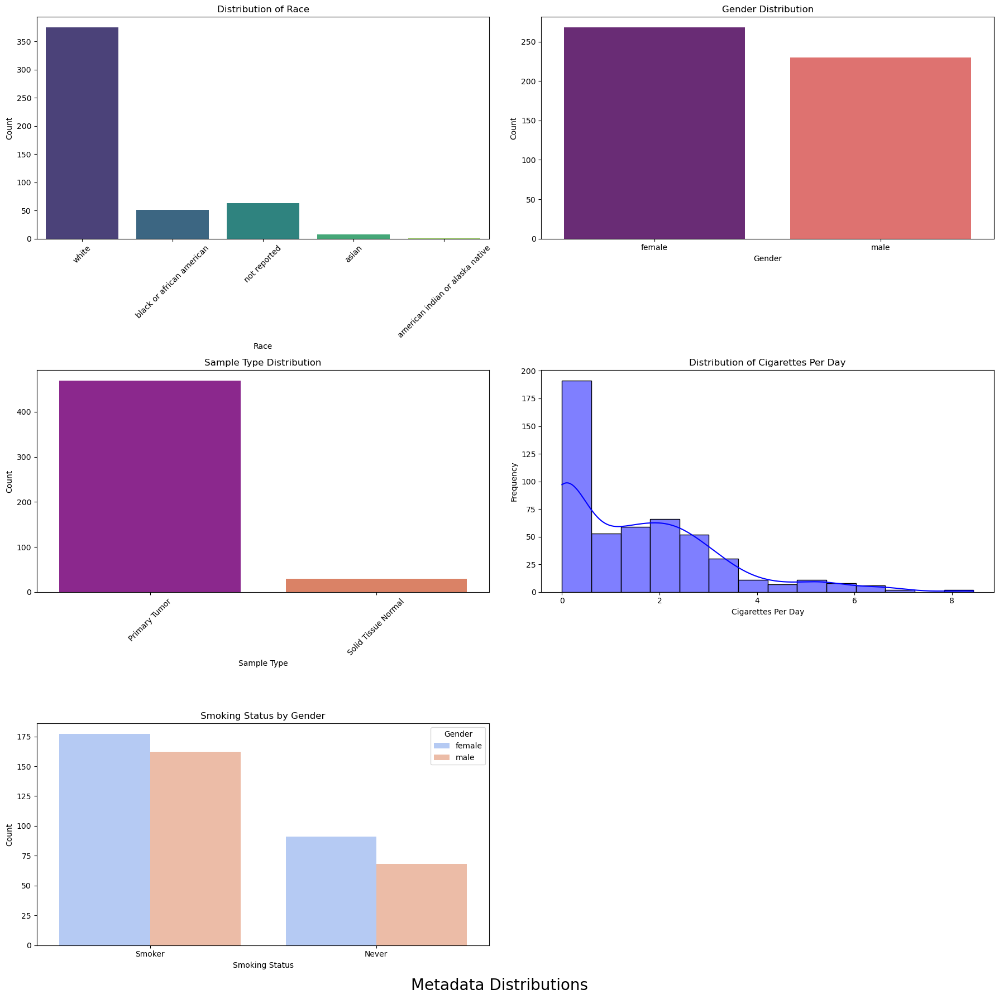

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the figure and axes for a 2-column layout
fig, axes = plt.subplots(3, 2, figsize=(18, 18))
fig.suptitle('Metadata Distributions', fontsize=20, y=0)

# Plot 1: Distribution of Race
sns.countplot(ax=axes[0, 0], x='race', data=data['datMeta'], palette='viridis')
axes[0, 0].set_title('Distribution of Race')
axes[0, 0].set_xlabel('Race')
axes[0, 0].set_ylabel('Count')
axes[0, 0].tick_params(axis='x', rotation=45)

# Plot 2: Gender Distribution
sns.countplot(ax=axes[0, 1], x='gender', data=data['datMeta'], palette='magma')
axes[0, 1].set_title('Gender Distribution')
axes[0, 1].set_xlabel('Gender')
axes[0, 1].set_ylabel('Count')

# Plot 3: Sample Type Distribution
sns.countplot(ax=axes[1, 0], x='sample_type', data=data['datMeta'], palette='plasma')
axes[1, 0].set_title('Sample Type Distribution')
axes[1, 0].set_xlabel('Sample Type')
axes[1, 0].set_ylabel('Count')
axes[1, 0].tick_params(axis='x', rotation=45)

# Plot 4: Distribution of Cigarettes Per Day
sns.histplot(ax=axes[1, 1], data=data['datMeta']['cigarettes_per_day'], kde=True, color='blue')
axes[1, 1].set_title('Distribution of Cigarettes Per Day')
axes[1, 1].set_xlabel('Cigarettes Per Day')
axes[1, 1].set_ylabel('Frequency')

# Plot 5: Smoking Status by Gender
sns.countplot(ax=axes[2, 0], x='Smoked', hue='gender', data=data['datMeta'], palette='coolwarm')
axes[2, 0].set_title('Smoking Status by Gender')
axes[2, 0].set_xlabel('Smoking Status')
axes[2, 0].set_ylabel('Count')
axes[2, 0].legend(title='Gender')

# Hide the empty subplot
axes[2, 1].axis('off')

# Adjust layout for better fit
plt.tight_layout()
plt.show()


In [10]:
expression_data = data["datExpr"]
expression_data

_row,ENSG00000000003.15,ENSG00000000419.13,ENSG00000000457.14,ENSG00000000460.17,ENSG00000000938.13,ENSG00000000971.16,ENSG00000001036.14,ENSG00000001084.13,ENSG00000001167.14,ENSG00000001460.18,...,ENSG00000288586.1,ENSG00000288596.2,ENSG00000288598.1,ENSG00000288611.1,ENSG00000288612.1,ENSG00000288638.1,ENSG00000288658.1,ENSG00000288663.1,ENSG00000288670.1,ENSG00000288675.1
TCGA-38-7271,11.3668,10.3673,9.7884,8.2552,10.6173,12.8447,10.8836,10.4437,10.8112,9.1178,...,4.4411,5.6909,3.8172,5.5378,4.5573,5.4255,5.1694,4.0073,7.97,4.664
TCGA-55-7914,11.5434,10.5282,9.7292,7.9951,8.4858,10.4696,10.4737,7.9065,11.8983,8.5842,...,4.768,8.0948,4.2182,3.5233,4.975,2.4821,6.0753,4.975,8.8543,4.3015
TCGA-95-7043,11.411,11.2018,9.4449,8.3546,7.3211,10.7856,11.6185,14.1836,10.8329,8.8155,...,4.2248,7.3539,5.0121,4.2248,4.8311,4.7304,5.5053,4.9246,7.6064,3.8623
TCGA-73-4658,12.2149,10.3249,9.234,7.7537,11.0656,12.3631,10.9023,10.06,11.2092,9.0663,...,4.2146,6.0253,3.8231,4.0984,4.6727,7.1082,7.1615,3.6533,7.3223,5.2312
TCGA-86-8076,11.2882,10.2095,9.8186,7.9844,10.5213,13.7848,11.2318,10.8315,10.5784,9.6428,...,4.7844,6.8675,4.5078,2.4821,5.1468,3.3897,4.2833,4.4553,8.1011,4.8254
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-86-8073,10.7676,10.5503,9.0277,8.2811,9.9471,11.8641,11.237,14.2843,10.9497,8.8266,...,4.2611,7.157,4.2187,5.2566,5.276,2.4821,6.695,5.1967,7.8098,4.3418
TCGA-MN-A4N4,11.656,11.0739,9.5578,8.7883,8.9532,11.0791,10.5202,11.331,11.3659,8.8701,...,4.3317,7.6037,5.0518,7.4063,6.5835,3.0746,5.9828,4.9634,7.9208,5.1745
TCGA-53-7626,10.8912,10.1742,9.6307,8.0179,10.6328,11.247,10.4815,9.8428,10.5795,9.86,...,5.6458,6.6984,4.646,3.1345,4.8113,3.8962,5.9768,4.2816,8.4192,4.4566
TCGA-44-A47G,11.32,9.9137,9.3312,7.8703,11.3029,12.8687,11.2659,12.4677,10.9404,9.4188,...,4.6125,8.0939,5.1263,2.4821,5.2619,5.0279,8.793,5.173,7.951,4.465


498 rows × 22637 columns is a quite large matrix, thus we have to consider reducing the dimensionality.


# Filtering before calculating the correlation matrices  

- Filter by Variance: Select genes with high variance across samples, as low variance genes might not contribute significantly to the analysis.
- 
Filter by Mean Expression: Select genes with high mean expression levels
- 
Use Principal Component Analysis (PCA): Reduce the dimensionality of the data using PCA before computing correlations.

In [11]:
# Ensure all columns are numeric
expression_data = expression_data.apply(pd.to_numeric, errors='coerce')

# Drop columns that could not be converted to numeric (if any)
expression_data = expression_data.dropna(axis=1, how='all')

In [12]:
expression_data.shape

(498, 22637)

In [13]:
print(f"Number of duplicate indices: {expression_data.index.duplicated().sum()}")  # Should be 0
print(f"Number of duplicate columns: {expression_data.columns.duplicated().sum()}")  # Should be 0


Number of duplicate indices: 0
Number of duplicate columns: 0


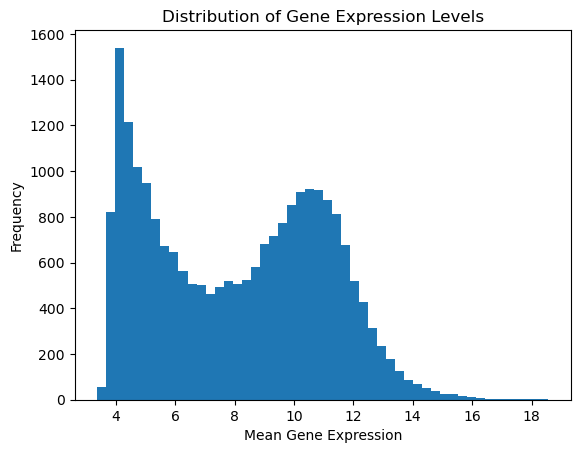

In [14]:
# Plot the distribution of gene expression levels and choose a threshold to exclude low-expressed genes.
gene_means = expression_data.mean(axis=0)
plt.hist(gene_means, bins=50)
plt.xlabel('Mean Gene Expression')
plt.ylabel('Frequency')
plt.title('Distribution of Gene Expression Levels')
plt.show()


In [15]:
def filter_low_expression_genes(data, threshold=1.0):
    # Calculate the mean expression for each gene
    gene_means = data.mean(axis=0)
    # Filter out genes with mean expression below the threshold
    mask = gene_means >= threshold
    filtered_data = data.loc[:, mask]
    return filtered_data

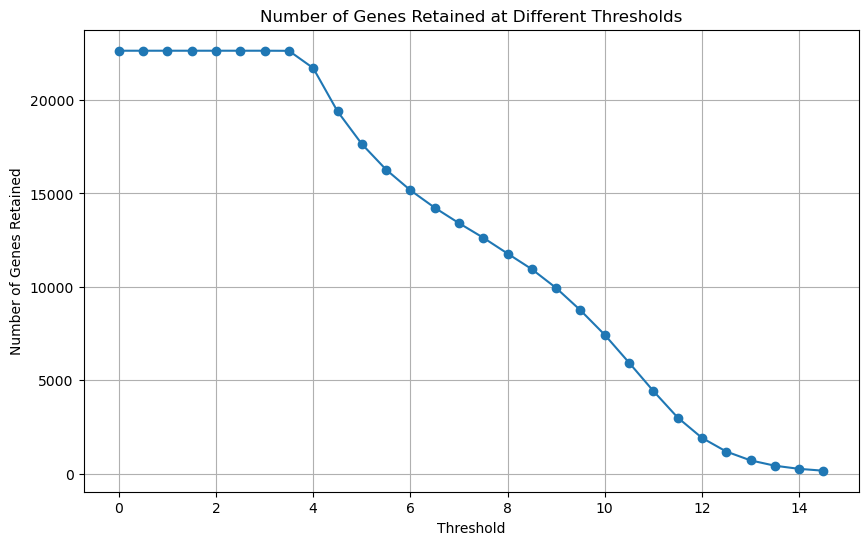

In [16]:
# Define a range of thresholds
thresholds = np.arange(0, 15, 0.5)

# List to store the number of genes retained at each threshold
num_genes = []

# Assuming df_renamed is your DataFrame with gene expression data
for threshold in thresholds:
    df_filtered = filter_low_expression_genes(expression_data, threshold)
    num_genes.append(df_filtered.shape[1])

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(thresholds, num_genes, marker='o')
plt.xlabel('Threshold')
plt.ylabel('Number of Genes Retained')
plt.title('Number of Genes Retained at Different Thresholds')
plt.grid(True)
plt.show()

Based on these two diagrams, let's choose threshold 9

In [17]:
# Assuming df_renamed is your DataFrame with gene expression data
df_filtered_expression = filter_low_expression_genes(expression_data, threshold=9)
print(f"Filtered data shape: {df_filtered_expression.shape}")  # Check the new shape to confirm filtering

Filtered data shape: (498, 9938)


In [18]:
def filter_high_variance_genes(data, threshold):
    """
    Filters out genes (columns) with variance below the specified threshold.

    Parameters:
    data (pd.DataFrame): DataFrame with gene expression data where rows are samples and columns are genes.
    threshold (float): Minimum variance level to keep a gene.

    Returns:
    pd.DataFrame: Filtered DataFrame with genes having variance above the threshold.
    """
    # Calculate the variance for each gene (column)
    gene_variances = data.var(axis=0)
    # Create a boolean mask to filter out genes with variance below the threshold
    mask = gene_variances >= threshold
    # Apply the mask to filter the DataFrame
    filtered_data = data.loc[:, mask]
    return filtered_data


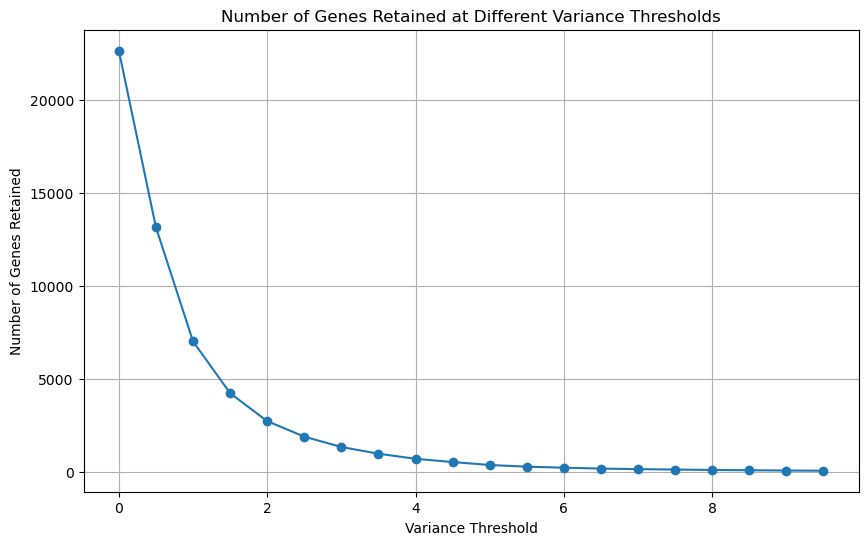

In [191]:
# Define a range of variance thresholds
variance_thresholds = np.arange(0, 10, 0.5)

# List to store the number of genes retained at each threshold
num_genes = []

# Assuming df_renamed is your DataFrame with gene expression data
for threshold in variance_thresholds:
    df_filtered = filter_high_variance_genes(expression_data, threshold)
    num_genes.append(df_filtered.shape[1])

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(variance_thresholds, num_genes, marker='o')
plt.xlabel('Variance Threshold')
plt.ylabel('Number of Genes Retained')
plt.title('Number of Genes Retained at Different Variance Thresholds')
plt.grid(True)
plt.show()

In [20]:
# Step 2: Filter based on variance
df_filtered_variance = filter_high_variance_genes(df_filtered_expression, threshold = 0.7)
print(f"Filtered data shape: {df_filtered_variance.shape}")  # Check the new shape to confirm filtering

Filtered data shape: (498, 2543)


In [21]:
df_filtered_variance.describe()

_row,ENSG00000000938.13,ENSG00000000971.16,ENSG00000001084.13,ENSG00000001617.12,ENSG00000002587.10,ENSG00000002933.9,ENSG00000003249.15,ENSG00000003436.16,ENSG00000003989.18,ENSG00000004468.13,...,ENSG00000275993.3,ENSG00000276168.1,ENSG00000276550.4,ENSG00000276600.5,ENSG00000277734.8,ENSG00000278196.3,ENSG00000279483.2,ENSG00000280411.1,ENSG00000283041.1,ENSG00000287263.1
count,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,...,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000
mean,9.889458,11.913815,11.026005,10.587472,9.639334,11.379190,10.305857,12.464504,10.871297,9.635965,...,9.349827,11.396387,9.434558,9.693509,10.250798,9.492962,9.054505,9.459002,9.015976,9.210173
std,1.107214,1.144649,1.683348,0.913826,1.299121,1.206815,1.026016,1.431349,2.153649,1.373490,...,1.606049,1.372040,1.281720,1.380215,1.135164,2.028517,1.025095,2.228748,0.934904,1.328298
min,6.998700,8.726900,6.894200,6.938500,5.339800,8.184700,3.959400,8.135700,5.570000,4.293000,...,3.495500,8.227600,5.633900,6.104500,5.599600,3.660600,4.512300,3.856500,6.554100,6.198700
25%,9.242600,11.188100,9.844800,9.991475,8.761200,10.617825,9.711425,11.532075,9.169175,8.771100,...,8.271400,10.622675,8.591450,8.774000,9.475900,8.009450,8.499525,7.888750,8.352275,8.280850
50%,9.832450,11.958200,10.814250,10.570250,9.597800,11.272100,10.442100,12.475150,10.679900,9.683600,...,9.302300,11.383100,9.567950,9.758900,10.315850,9.582150,9.049800,9.494500,9.024100,9.041900
75%,10.556050,12.715050,11.974150,11.099200,10.573650,12.158850,10.971375,13.424050,12.501000,10.575575,...,10.644325,12.032800,10.396100,10.594500,11.067575,10.920125,9.701525,11.058200,9.667400,10.076275
max,13.765300,15.805400,16.039600,14.668400,13.773600,15.123700,12.960000,16.461600,16.506900,13.377000,...,13.550600,22.536700,12.123000,13.589100,12.910500,14.963300,12.116000,14.981900,11.557200,13.328900


# ENSG to HGCN gene symbol

In [22]:
import mygene

def rename_ensembl_to_gene_names(df, chunk_size=1000):
    """
    Renames Ensembl gene IDs to gene names using mygene.
    
    Parameters:
    df (pd.DataFrame): DataFrame with Ensembl gene IDs as columns.
    chunk_size (int): Number of Ensembl IDs to query at a time.
    
    Returns:
    pd.DataFrame: DataFrame with gene names as columns, excluding genes that couldn't be mapped.
    """
    
    # Make a copy of the DataFrame to avoid modifying the original
    df_copy = df.copy()

    # Remove the `.number` suffix from ENSG IDs
    df_copy.columns = df_copy.columns.str.split('.').str[0]

    # Initialize mygene client
    mg = mygene.MyGeneInfo()

    # Split ENSG IDs into smaller chunks
    def chunks(lst, n):
        """Yield successive n-sized chunks from lst."""
        for i in range(0, len(lst), n):
            yield lst[i:i + n]

    ensg_ids = df_copy.columns.tolist()
    gene_mappings = []

    for chunk in chunks(ensg_ids, chunk_size):
        result = mg.querymany(chunk, scopes='ensembl.gene', fields='symbol', species='human')
        gene_mappings.extend(result)

    # Create a mapping from ENSG to gene symbol, handle missing mappings
    ensg_to_gene = {item['query']: item.get('symbol', None) for item in gene_mappings}
    
    # Log the unmapped genes
    unmapped_genes = [gene for gene in ensg_ids if ensg_to_gene.get(gene) is None]
    if unmapped_genes:
        print(f"Unmapped genes: {unmapped_genes}")

    # Filter out genes that couldn't be mapped
    mapped_columns = [ensg_to_gene[ensg] for ensg in df_copy.columns if ensg_to_gene[ensg] is not None]

    # Filter the DataFrame to only include columns that have been mapped
    df_filtered = df_copy.loc[:, df_copy.columns.isin(ensg_to_gene.keys())]

    # Further filter to ensure we have the same number of columns as mapped gene names
    df_filtered = df_filtered.loc[:, [ensg for ensg in df_filtered.columns if ensg_to_gene[ensg] is not None]]

    # Assign new column names
    df_filtered.columns = [ensg_to_gene[ensg] for ensg in df_filtered.columns]

    # Handle duplicate gene names by aggregating them (e.g., by taking the mean)
    df_final = df_filtered.T.groupby(df_filtered.columns).mean().T

    return df_final

In [23]:
df_renamed = rename_ensembl_to_gene_names(df_filtered_variance)

1 input query terms found no hit:	['ENSG00000112096']


Unmapped genes: ['ENSG00000112096', 'ENSG00000230551', 'ENSG00000237550', 'ENSG00000279483']


In [24]:
df_filtered_variance.shape

(498, 2543)

In [25]:
df_renamed.shape

(498, 2539)

In [26]:
df_renamed.head()

,A2M,A4GALT,AASS,AATK,ABAT,ABCA1,ABCA3,ABCA5,ABCA7,ABCC3,...,ZNF528,ZNF542P,ZNF608,ZNF692,ZNF703,ZNF704,ZNF710,ZSCAN18,ZSCAN31,ZWINT
TCGA-38-7271,17.7492,10.1862,11.2890,8.6552,9.3090,11.6549,14.7719,8.4864,10.0852,12.5540,...,8.4655,9.0863,9.4605,8.9876,10.0177,10.4701,10.4908,9.5323,9.0817,9.2615
TCGA-55-7914,14.8513,8.9312,10.5920,8.2660,8.7082,11.4592,14.4695,8.0347,10.2805,13.7737,...,8.9520,6.9226,9.8560,10.4064,11.8623,10.4383,10.6423,10.3934,10.9565,10.1334
TCGA-95-7043,14.1691,9.0834,10.5600,8.8214,10.4276,10.5081,12.5230,10.3175,8.2187,14.9542,...,7.7241,6.9648,8.0587,9.6337,15.9172,10.5026,9.5442,10.1984,10.8095,10.9149
TCGA-73-4658,16.7238,9.1443,10.5574,7.8940,9.0129,11.7183,13.7542,7.3455,10.1906,12.4963,...,7.8461,9.0593,8.4540,9.0452,10.1434,9.5153,10.9877,8.7077,8.9874,9.7828
TCGA-86-8076,15.6783,9.5150,10.3567,10.4765,10.0012,11.6653,13.2599,9.6646,11.8002,12.2218,...,8.0522,9.2877,9.9354,10.3185,10.1469,10.1274,11.0332,8.8800,9.5810,8.6640


## Check for NA, handling missing data, outlier check

In [27]:
# Check for missing values in each column
missing_values = df_renamed.isnull().sum()

# Calculate the percentage of missing values for each column
missing_percentage = (missing_values / len(data)) * 100

# Create a DataFrame to hold the missing data statistics
missing_stats = pd.DataFrame({'Total Missing': missing_values, 'Percentage': missing_percentage})

# Filter to display only columns with missing values
missing_stats = missing_stats[missing_stats['Total Missing'] > 0]

# Print out the missing values statistics for columns with missing data
if not missing_stats.empty:
    print("Missing values in columns:")
    print(missing_stats)
else:
    print("No missing values found in the dataset.")

No missing values found in the dataset.


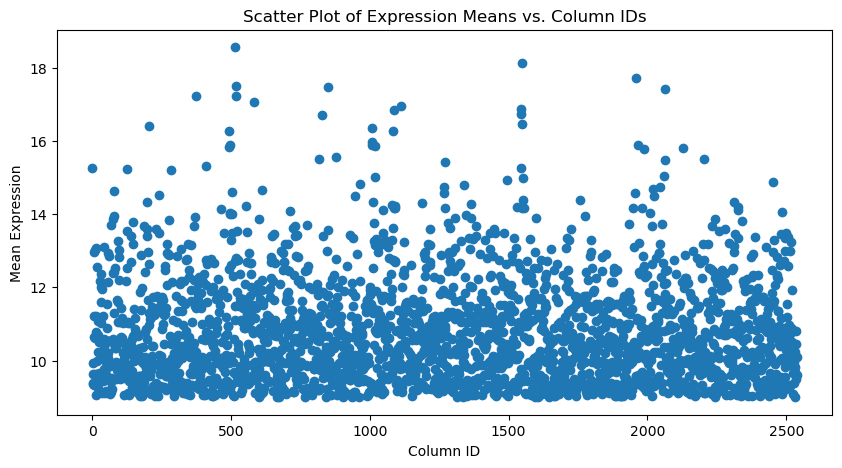

In [28]:
# Calculate the mean of each column
means = df_renamed.mean()

# Create a list of column IDs (integer index)
column_ids = np.arange(len(df_renamed.columns))

# Plotting
plt.figure(figsize=(10, 5))
plt.scatter(column_ids, means)

# Labeling the axes
plt.xlabel('Column ID')
plt.ylabel('Mean Expression')

# Adding a title
plt.title('Scatter Plot of Expression Means vs. Column IDs')

# Adjust xticks to label each point with the corresponding column name
#plt.xticks(column_ids, df.columns)

plt.show()

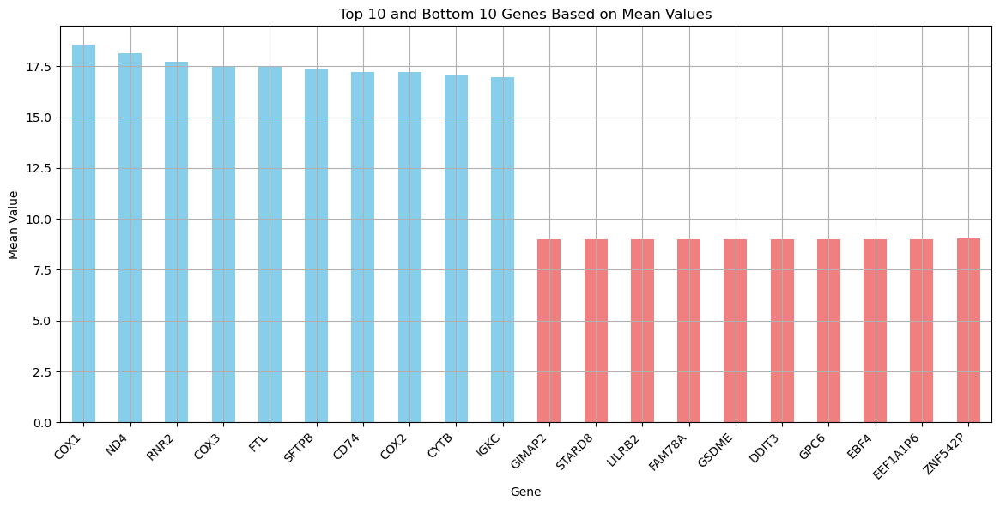

In [29]:
# Calculate means for each column
means = df_renamed.mean()

# Sort and get the top 10 and bottom 10 columns based on their mean values
top_10_columns = means.sort_values(ascending=False).head(10)
bottom_10_columns = means.sort_values(ascending=True).head(10)

# Combine top 10 and bottom 10 columns into one DataFrame
combined = pd.concat([top_10_columns, bottom_10_columns])

# Plot the results
plt.figure(figsize=(14, 6))
combined.plot(kind='bar', color=['skyblue' if i < 10 else 'lightcoral' for i in range(20)])
plt.title('Top 10 and Bottom 10 Genes Based on Mean Values')
plt.ylabel('Mean Value')
plt.xlabel('Gene')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.show()

## Handling Missing data ??
### TODO: low priority

## Data heterogeneity

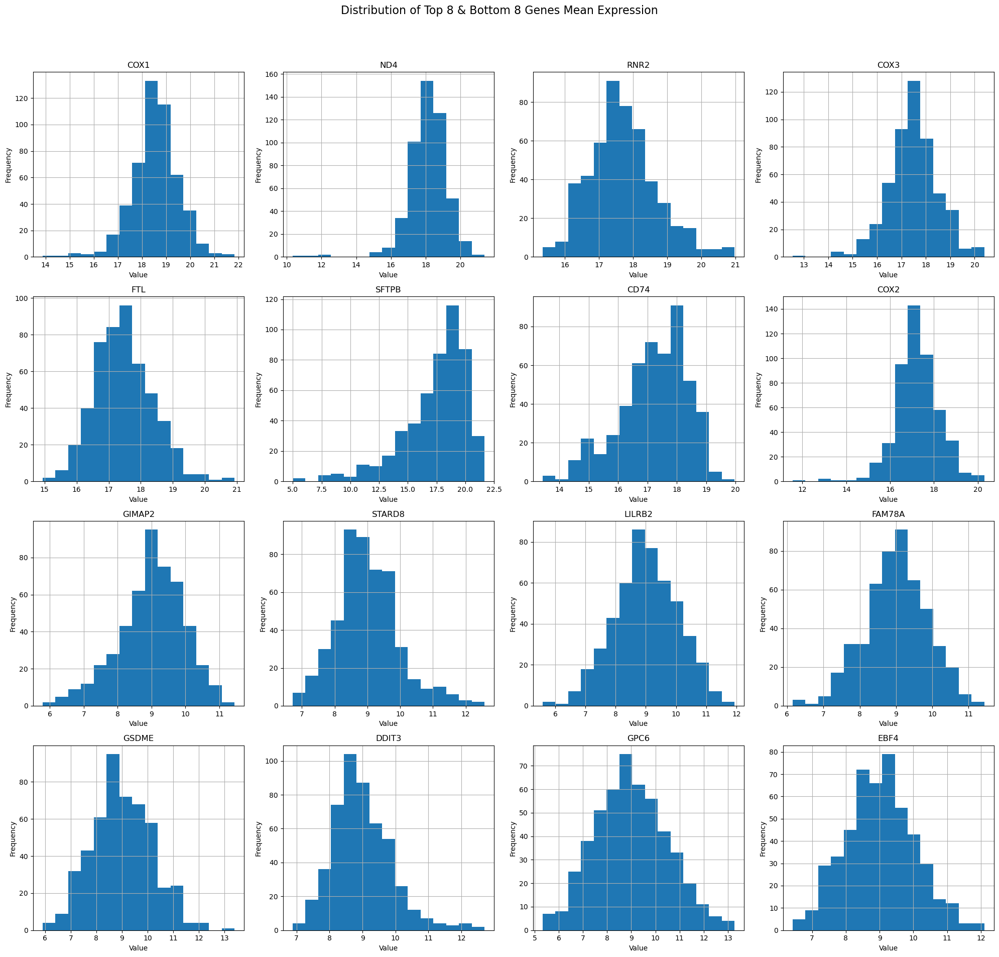

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

# Assume expression_data is already loaded
# Select numerical columns
numerical_columns = df_renamed.select_dtypes(include=['float64', 'int64'])

# Calculate the mean of each column for the numerical columns only
means = numerical_columns.mean()

# Get the top 10 and bottom 10 columns based on mean values
top_8_columns = means.nlargest(8).index.tolist()
bottom_8_columns = means.nsmallest(8).index.tolist()

# Combine top 10 and bottom 10 columns for plotting
columns_to_plot = top_8_columns + bottom_8_columns

# Filter the numerical columns to only include those to plot
filtered_numerical_columns = numerical_columns[columns_to_plot]

# Calculate the number of rows needed for subplots based on the number of selected columns
num_plots = len(filtered_numerical_columns.columns)
num_rows = (num_plots // 4) + (num_plots % 4 > 0)  # Ensure there is an extra row if there are leftovers

# Plot histograms for each selected numerical column
fig, axes = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))  # Adjust width and height as needed
fig.suptitle('Distribution of Top 8 & Bottom 8 Genes Mean Expression', fontsize=16)

for i, col in enumerate(filtered_numerical_columns.columns):
    ax = axes.flatten()[i]
    filtered_numerical_columns[col].hist(bins=15, ax=ax)
    ax.set_title(col)
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

# Hide any unused axes if the number of plots isn't a perfect multiple of 4
if num_plots % 4:
    for ax in axes.flatten()[num_plots:]:
        ax.set_visible(False)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the suptitle
plt.show()

# Calculate Correlation Matrices

In [32]:
import astropy.stats

def abs_bicorr(data):
    # Select only numeric data
    data = data._get_numeric_data()
    cols = data.columns
    idx = cols.copy()
    mat = data.to_numpy(dtype=float, na_value=np.nan, copy=False)
    mat = mat.T

    K = len(cols)
    correl = np.empty((K, K), dtype=np.float32)

    # Calculate biweight midcovariance
    bicorr = astropy.stats.biweight_midcovariance(mat, modify_sample_size=True)

    for i in range(K):
        for j in range(K):
            if i == j:
                correl[i, j] = 1.0
            else:
                denominator = np.sqrt(bicorr[i, i] * bicorr[j, j])
                if denominator != 0:
                    correl[i, j] = bicorr[i, j] / denominator
                else:
                    correl[i, j] = 0  # Or handle it in another appropriate way

    return pd.DataFrame(data=np.abs(correl), index=idx, columns=cols, dtype=np.float32)

In [33]:
from sklearn.feature_selection import mutual_info_regression

# Function to calculate mutual information
def mutual_information(df):
    mi = pd.DataFrame(index=df.columns, columns=df.columns)
    for i in range(len(df.columns)):
        for j in range(len(df.columns)):
            if i != j:
                mi.iloc[i, j] = mutual_info_regression(df.iloc[:, i].values.reshape(-1, 1), df.iloc[:, j].values)[0]
            else:
                mi.iloc[i, j] = 1.0
    return mi.astype(float)


In [34]:
# Dictionary to store different correlation matrices
correlation_matrices = {}

# Pearson correlation
correlation_matrices['pearson'] = df_renamed.corr(method='pearson')

# Spearman rank correlation
correlation_matrices['spearman'] = df_renamed.corr(method='spearman')

# Biweight midcorrelation
correlation_matrices['biweight_midcorrelation'] = abs_bicorr(df_renamed)

# Mutual information - slow O(n3)
# correlation_matrices['mutual_information'] = mutual_information(df_renamed)

# Print the keys of the correlation matrices to verify
print("Correlation matrices calculated:")
print(correlation_matrices.keys())

Correlation matrices calculated:
dict_keys(['pearson', 'spearman', 'biweight_midcorrelation'])


In [38]:
# Visualize correlation matrices using heatmaps
def plot_correlation_matrices(correlation_matrices):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Adjust to 1 row and 3 columns
    axes = axes.flatten()
    
    for i, (key, matrix) in enumerate(correlation_matrices.items()):
        sns.heatmap(matrix, ax=axes[i], cmap='coolwarm', cbar=True, xticklabels=False, yticklabels=False)
        axes[i].set_title(f'{key.capitalize()} Correlation Matrix')
    
    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)
    
    plt.tight_layout()
    plt.show()

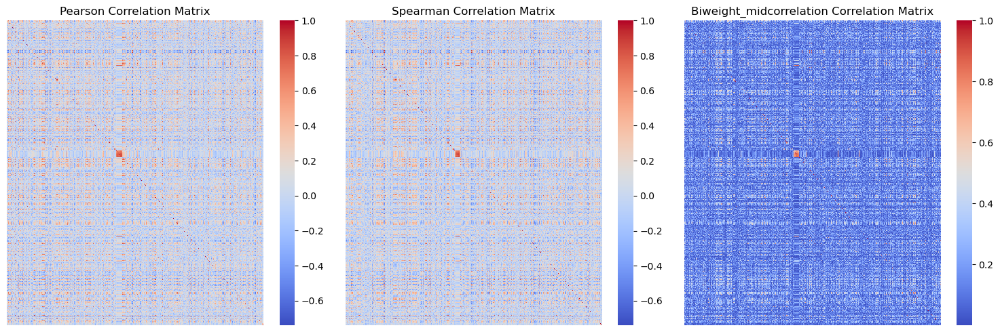

In [39]:
plot_correlation_matrices(correlation_matrices)


In [41]:
correlation_matrices['pearson'].shape

(2539, 2539)

# TODO: remove eye()

In [50]:
# Save the entire dictionary of correlation matrices as a pickle file
with open(r"C:\cdt_data\ismb_data\correlation_matrices.pkl", 'wb') as f:
    pickle.dump(correlation_matrices, f)

# Load the entire dictionary of correlation matrices from a pickle file
with open(r"C:\cdt_data\ismb_data\correlation_matrices.pkl", 'rb') as f:
    loaded_correlation_matrices = pickle.load(f)

# Verify the loaded data
print(loaded_correlation_matrices.keys())

dict_keys(['pearson', 'spearman', 'biweight_midcorrelation'])


# Construct Graphs from correlation matrices

In [93]:
import networkx as nx
import pandas as pd

def create_graph_from_correlation(correlation_matrix, threshold=0.8):
    """
    Creates a graph from a correlation matrix using a specified threshold.

    Parameters:
    correlation_matrix (pd.DataFrame): DataFrame containing the correlation matrix.
    threshold (float): Threshold for including edges based on correlation value.

    Returns:
    G (nx.Graph): Graph created from the correlation matrix.
    """
    G = nx.Graph()

    # Add nodes
    for node in correlation_matrix.columns:
        G.add_node(node)

    # Add edges with weights above the threshold
    for i in range(correlation_matrix.shape[0]):
        for j in range(i + 1, correlation_matrix.shape[1]):
            weight = correlation_matrix.iloc[i, j]
            if abs(weight) >= threshold:
                G.add_edge(correlation_matrix.index[i], correlation_matrix.columns[j], weight=weight)

    return G

In [105]:
def verify_edge_weights(G, num_samples=10):
    """
    Verifies that edges in the graph have the correct weights from the correlation matrix.

    Parameters:
    G (nx.Graph): The NetworkX graph.
    num_samples (int): Number of edges to sample and print for verification.
    """
    edges = list(G.edges(data=True))
    sample = edges[:num_samples] if len(edges) > num_samples else edges
    
    print(f"Sample of {len(sample)} edges with weights:")
    for u, v, data in sample:
        print(f"Edge ({u}, {v}) - weight: {data['weight']}")


In [184]:
# Example usage
# Assuming correlation_matrices is a dictionary containing your correlation matrices
pearson_graph = create_graph_from_correlation(correlation_matrices['pearson'], threshold=0.8)

In [107]:
verify_edge_weights(pearson_graph, num_samples=10)

Sample of 10 edges with weights:
Edge (A2M, AOC3) - weight: 0.8767411078325781
Edge (A2M, C7) - weight: 0.8013688242083488
Edge (A2M, ERG) - weight: 0.8094520354646654
Edge (A2M, INMT) - weight: 0.8117391230502314
Edge (A2M, ITGA8) - weight: 0.8724141478160804
Edge (A2M, LAMA2) - weight: 0.8150087035757122
Edge (A2M, MFAP4) - weight: 0.8444697225886688
Edge (A2M, SCN7A) - weight: 0.8382334505662205
Edge (A2M, SLIT2) - weight: 0.8041515706739126
Edge (A2M, SLIT3) - weight: 0.8600007155510168


In [46]:
biweight_graph = create_graph_from_correlation(correlation_matrices['biweight_midcorrelation'], threshold=0.8)

In [188]:
# Function to visualize the graph
def visualize_graph(G, title='Gene Co-expression Network'):
    """
    Visualizes the graph using Matplotlib and NetworkX.

    Parameters:
    G (nx.Graph): Graph to visualize.
    title (str): Title of the plot.
    """
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(G, k=0.1)  # k controls the distance between nodes
    nx.draw_networkx_nodes(G, pos, node_size=50, node_color='blue', alpha=0.7)
    nx.draw_networkx_edges(G, pos, width=0.2, alpha=0.5)
    plt.title(title)
    plt.show()

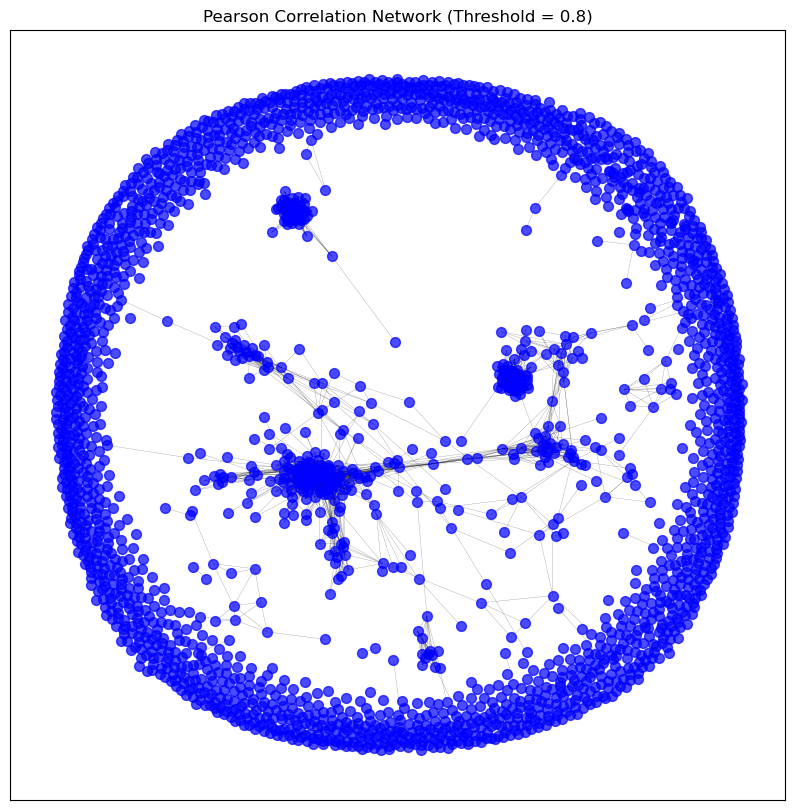

In [108]:
# Visualize the graph
visualize_graph(pearson_graph, title='Pearson Correlation Network (Threshold = 0.8)')

In [192]:
print_graph_info(pearson_graph)

Number of nodes: 2539
Number of edges: 4291
Sample nodes: ['A2M', 'A4GALT', 'AASS', 'AATK', 'ABAT', 'ABCA1', 'ABCA3', 'ABCA5', 'ABCA7', 'ABCC3']
Sample edges: [('A2M', 'AOC3', {'weight': 0.8767411078325781}), ('A2M', 'C7', {'weight': 0.8013688242083488}), ('A2M', 'ERG', {'weight': 0.8094520354646654}), ('A2M', 'INMT', {'weight': 0.8117391230502314}), ('A2M', 'ITGA8', {'weight': 0.8724141478160804}), ('A2M', 'LAMA2', {'weight': 0.8150087035757122}), ('A2M', 'MFAP4', {'weight': 0.8444697225886688}), ('A2M', 'SCN7A', {'weight': 0.8382334505662205}), ('A2M', 'SLIT2', {'weight': 0.8041515706739126}), ('A2M', 'SLIT3', {'weight': 0.8600007155510168})]


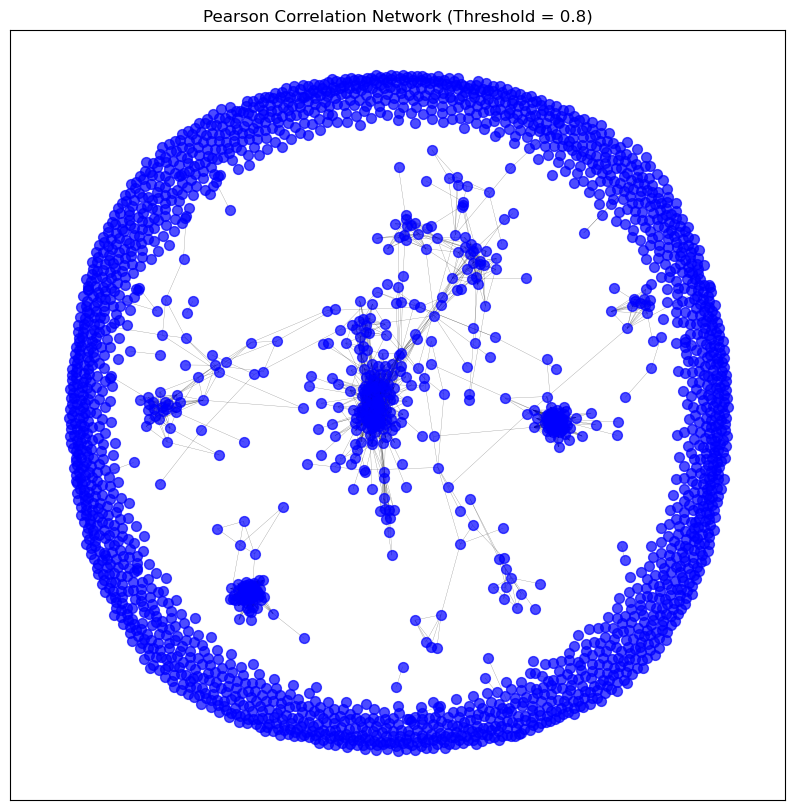

In [47]:
visualize_graph(biweight_graph, title='Biweight MidCorrelation Network (Threshold = 0.8)')

# Cleaning the network

In [179]:
def print_graph_info(G):
    """
    Prints basic information about the graph.
    
    Parameters:
    G (nx.Graph): The NetworkX graph.
    """
    print(f"Number of nodes: {G.number_of_nodes()}")
    print(f"Number of edges: {G.number_of_edges()}")
    print("Sample nodes:", list(G.nodes)[:10])  # Print first 10 nodes as a sample
    print("Sample edges:", list(G.edges(data=True))[:10])  # Print first 10 edges as a sample

def calculate_average_clustering(G):
    """
    Calculates and prints the average clustering coefficient of the graph.
    
    Parameters:
    G (nx.Graph): The NetworkX graph.
    """
    avg_clustering = nx.average_clustering(G)
    print(f"Average clustering coefficient: {avg_clustering}")

In [186]:
print("Graph Information:")
print_graph_info(pearson_graph)

print("\nClustering Coefficient:")
calculate_average_clustering(pearson_graph)

Graph Information:
Number of nodes: 2539
Number of edges: 4291
Sample nodes: ['A2M', 'A4GALT', 'AASS', 'AATK', 'ABAT', 'ABCA1', 'ABCA3', 'ABCA5', 'ABCA7', 'ABCC3']
Sample edges: [('A2M', 'AOC3', {'weight': 0.8767411078325781}), ('A2M', 'C7', {'weight': 0.8013688242083488}), ('A2M', 'ERG', {'weight': 0.8094520354646654}), ('A2M', 'INMT', {'weight': 0.8117391230502314}), ('A2M', 'ITGA8', {'weight': 0.8724141478160804}), ('A2M', 'LAMA2', {'weight': 0.8150087035757122}), ('A2M', 'MFAP4', {'weight': 0.8444697225886688}), ('A2M', 'SCN7A', {'weight': 0.8382334505662205}), ('A2M', 'SLIT2', {'weight': 0.8041515706739126}), ('A2M', 'SLIT3', {'weight': 0.8600007155510168})]

Clustering Coefficient:
Average clustering coefficient: 0.11740089225822176


In [180]:
def clean_graph(G, degree_threshold=1, keep_largest_component=True):
    """
    Cleans the graph by performing several cleaning steps:
    - Removes unconnected nodes (isolates)
    - Removes self-loops
    - Removes nodes with a degree below a specified threshold
    - Keeps only the largest connected component (optional)

    Parameters:
    G (nx.Graph): The NetworkX graph to clean.
    degree_threshold (int): Minimum degree for nodes to keep.
    keep_largest_component (bool): Whether to keep only the largest connected component.

    Returns:
    G (nx.Graph): Cleaned graph.
    """
    # Remove self-loops
    G.remove_edges_from(nx.selfloop_edges(G))

    # Remove nodes with no edges (isolates)
    G.remove_nodes_from(list(nx.isolates(G)))

    # Remove nodes with degree below the threshold
    low_degree_nodes = [node for node, degree in dict(G.degree()).items() if degree < degree_threshold]
    G.remove_nodes_from(low_degree_nodes)

    # Keep only the largest connected component
    if keep_largest_component:
        largest_cc = max(nx.connected_components(G), key=len)
        G = G.subgraph(largest_cc).copy()

    return G

In [111]:
# Clean the graph by removing unconnected nodes
pearson_graph_cleaned = clean_graph(pearson_graph,
                                    degree_threshold=0,
                                    keep_largest_component=False)

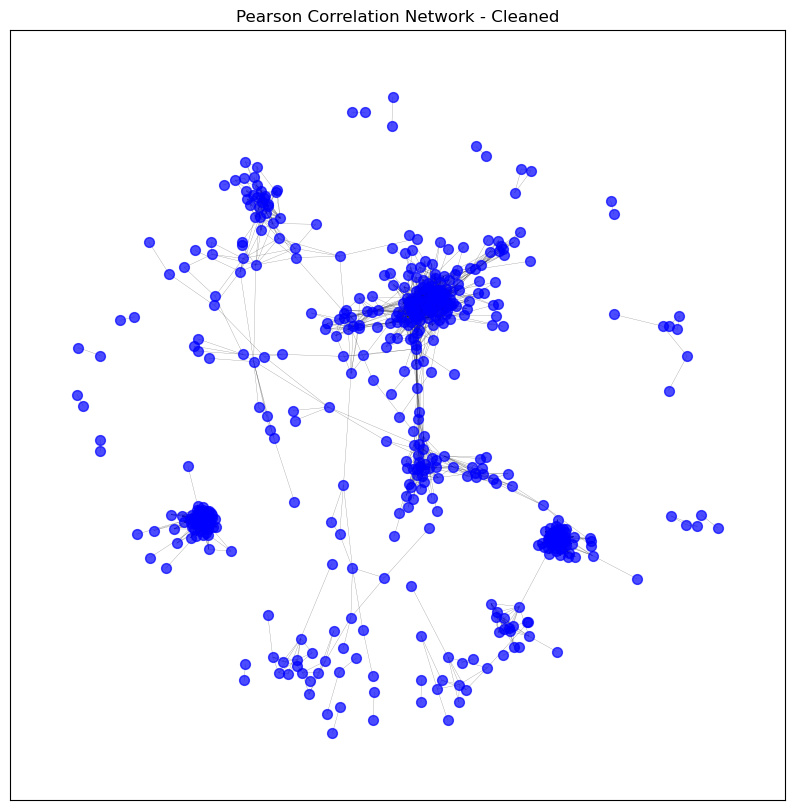

In [112]:
visualize_graph(pearson_graph_cleaned, title='Pearson Correlation Network - Cleaned')

In [194]:
print_graph_info(pearson_graph_cleaned)

Number of nodes: 500
Number of edges: 4291
Sample nodes: ['A2M', 'ABI3BP', 'ACAP1', 'ACP5', 'ACTA2', 'ACTG2', 'ACVRL1', 'ADAM12', 'ADAMTS12', 'ADAMTS2']
Sample edges: [('A2M', 'AOC3', {'weight': 0.8767411078325781}), ('A2M', 'C7', {'weight': 0.8013688242083488}), ('A2M', 'ERG', {'weight': 0.8094520354646654}), ('A2M', 'INMT', {'weight': 0.8117391230502314}), ('A2M', 'ITGA8', {'weight': 0.8724141478160804}), ('A2M', 'LAMA2', {'weight': 0.8150087035757122}), ('A2M', 'MFAP4', {'weight': 0.8444697225886688}), ('A2M', 'SCN7A', {'weight': 0.8382334505662205}), ('A2M', 'SLIT2', {'weight': 0.8041515706739126}), ('A2M', 'SLIT3', {'weight': 0.8600007155510168})]


In [116]:
# Clean the graph by removing unconnected nodes
pearson_graph_pruned = clean_graph(pearson_graph,
                                    degree_threshold=1,
                                    keep_largest_component=True)

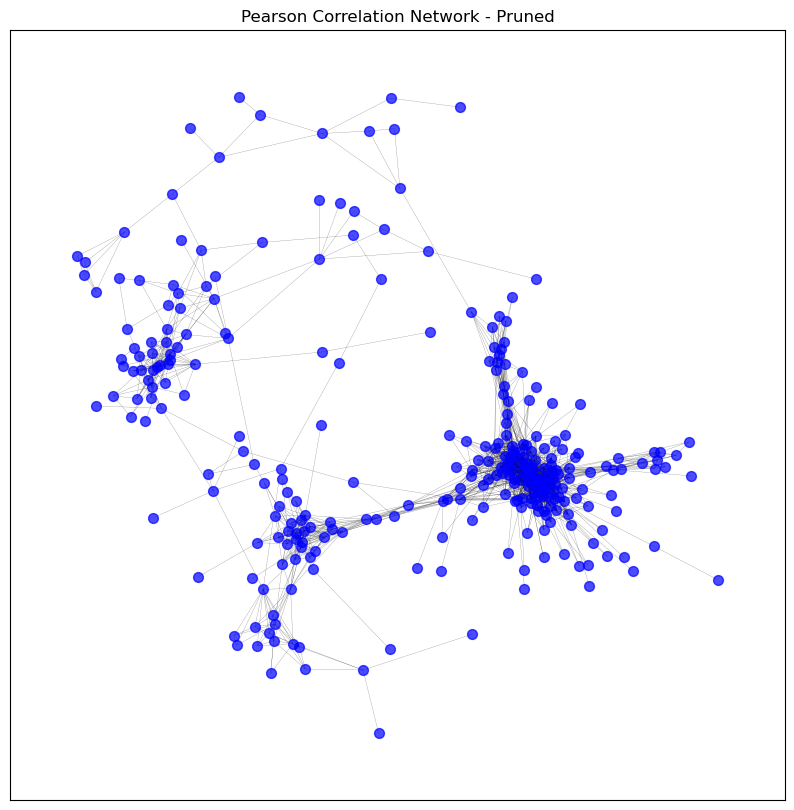

In [118]:
visualize_graph(pearson_graph_pruned, title='Pearson Correlation Network - Pruned')

In [200]:
#example
nx.write_gml(pearson_graph_pruned, 'gene_coexpression_network.gml')


In [121]:
verify_edge_weights(pearson_graph_pruned, num_samples=10)

Sample of 10 edges with weights:
Edge (A2M, AOC3) - weight: 0.8767411078325781
Edge (A2M, C7) - weight: 0.8013688242083488
Edge (A2M, ERG) - weight: 0.8094520354646654
Edge (A2M, INMT) - weight: 0.8117391230502314
Edge (A2M, ITGA8) - weight: 0.8724141478160804
Edge (A2M, LAMA2) - weight: 0.8150087035757122
Edge (A2M, MFAP4) - weight: 0.8444697225886688
Edge (A2M, SCN7A) - weight: 0.8382334505662205
Edge (A2M, SLIT2) - weight: 0.8041515706739126
Edge (A2M, SLIT3) - weight: 0.8600007155510168


In [195]:
print_graph_info(pearson_graph_pruned)

Number of nodes: 300
Number of edges: 2284
Sample nodes: ['A2M', 'ABI3BP', 'ACAP1', 'ACP5', 'ACTA2', 'ACTG2', 'ACVRL1', 'ADAM12', 'ADAMTS12', 'ADAMTS2']
Sample edges: [('A2M', 'AOC3', {'weight': 0.8767411078325781}), ('A2M', 'C7', {'weight': 0.8013688242083488}), ('A2M', 'ERG', {'weight': 0.8094520354646654}), ('A2M', 'INMT', {'weight': 0.8117391230502314}), ('A2M', 'ITGA8', {'weight': 0.8724141478160804}), ('A2M', 'LAMA2', {'weight': 0.8150087035757122}), ('A2M', 'MFAP4', {'weight': 0.8444697225886688}), ('A2M', 'SCN7A', {'weight': 0.8382334505662205}), ('A2M', 'SLIT2', {'weight': 0.8041515706739126}), ('A2M', 'SLIT3', {'weight': 0.8600007155510168})]


In [57]:
# visualize_interactive_network(pearson_graph_cleaned, output_file='pearson_network_cleaned.html')


Local cdn resources have problems on chrome/safari when used in jupyter-notebook. 


# Sparsification methods

Edge Sampling: Randomly removes a fraction of edges.
Thresholding: Removes edges with weights below a certain threshold.
Degree-based Sparsification: Preserves

Graph Information:
Number of nodes: 300
Number of edges: 2284
Sample nodes: ['A2M', 'ABI3BP', 'ACAP1', 'ACP5', 'ACTA2', 'ACTG2', 'ACVRL1', 'ADAM12', 'ADAMTS12', 'ADAMTS2']
Sample edges: [('A2M', 'AOC3', {'weight': 0.8767411078325781}), ('A2M', 'C7', {'weight': 0.8013688242083488}), ('A2M', 'ERG', {'weight': 0.8094520354646654}), ('A2M', 'INMT', {'weight': 0.8117391230502314}), ('A2M', 'ITGA8', {'weight': 0.8724141478160804}), ('A2M', 'LAMA2', {'weight': 0.8150087035757122}), ('A2M', 'MFAP4', {'weight': 0.8444697225886688}), ('A2M', 'SCN7A', {'weight': 0.8382334505662205}), ('A2M', 'SLIT2', {'weight': 0.8041515706739126}), ('A2M', 'SLIT3', {'weight': 0.8600007155510168})]

Edge Attribute Check:
All edges have the 'weight' attribute.

Self-Loops and Isolates Check:
Number of self-loops: 0
Number of isolates: 0

Degree Distribution:


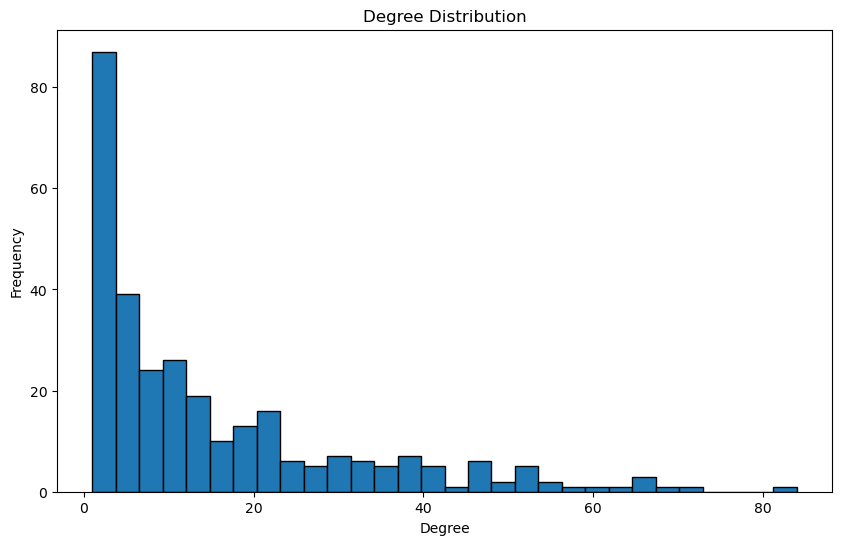


Clustering Coefficient:
Average clustering coefficient: 0.5759481981488631


In [177]:
import networkx as nx
import matplotlib.pyplot as plt


def check_edge_attributes(G, attribute='weight'):
    """
    Checks if all edges have the specified attribute.
    
    Parameters:
    G (nx.Graph): The NetworkX graph.
    attribute (str): The edge attribute to check for.
    
    Returns:
    bool: True if all edges have the attribute, False otherwise.
    """
    missing_attributes = False
    for u, v in G.edges():
        if attribute not in G[u][v]:
            print(f"Edge ({u}, {v}) is missing the '{attribute}' attribute.")
            missing_attributes = True
    return not missing_attributes

def check_self_loops_and_isolates(G):
    """
    Checks and prints the number of self-loops and isolates in the graph.
    
    Parameters:
    G (nx.Graph): The NetworkX graph.
    """
    self_loops = list(nx.selfloop_edges(G))
    isolates = list(nx.isolates(G))

    print(f"Number of self-loops: {len(self_loops)}")
    if self_loops:
        print(f"Self-loops: {self_loops}")
    
    print(f"Number of isolates: {len(isolates)}")
    if isolates:
        print(f"Isolates: {isolates}")

def plot_degree_distribution(G):
    """
    Plots the degree distribution of the graph.
    
    Parameters:
    G (nx.Graph): The NetworkX graph.
    """
    degrees = [d for n, d in G.degree()]
    plt.figure(figsize=(10, 6))
    plt.hist(degrees, bins=30, edgecolor='black')
    plt.title('Degree Distribution')
    plt.xlabel('Degree')
    plt.ylabel('Frequency')
    plt.show()



# Example usage with your graph
# Assuming pearson_graph_pruned is your NetworkX graph
print("Graph Information:")
print_graph_info(pearson_graph_pruned)

print("\nEdge Attribute Check:")
if check_edge_attributes(pearson_graph_pruned, 'weight'):
    print("All edges have the 'weight' attribute.")
else:
    print("Some edges are missing the 'weight' attribute.")

print("\nSelf-Loops and Isolates Check:")
check_self_loops_and_isolates(pearson_graph_pruned)

print("\nDegree Distribution:")
plot_degree_distribution(pearson_graph_pruned)

print("\nClustering Coefficient:")
calculate_average_clustering(pearson_graph_pruned)


In [123]:
def handle_missing_weights(G, default_weight=1.0):
    """
    Assigns a default weight to edges that are missing the 'weight' attribute.

    Parameters:
    G (nx.Graph): The NetworkX graph.
    default_weight (float): The default weight to assign.

    Returns:
    G (nx.Graph): The graph with all edges having weights.
    """
    for u, v in G.edges():
        if 'weight' not in G[u][v]:
            G[u][v]['weight'] = default_weight
    return G

In [124]:
pearson_graph_pruned = handle_missing_weights(pearson_graph_pruned, default_weight=1.0)

In [88]:
def visualize_edge_weight_distribution(G):
    """
    Visualizes the distribution of edge weights using a histogram and KDE plot.

    Parameters:
    edge_weights (list): List of edge weights.
    """
    plt.figure(figsize=(10, 6))
    edge_weights = [G[u][v]['weight'] for u, v in G.edges()]
    # Histogram
    sns.histplot(edge_weights, bins=30, kde=True)
    
    plt.title('Distribution of Edge Weights')
    plt.xlabel('Edge Weight')
    plt.ylabel('Frequency')
    plt.show()

C:\Users\sebestyenkamp\anaconda3\envs\ismbenv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


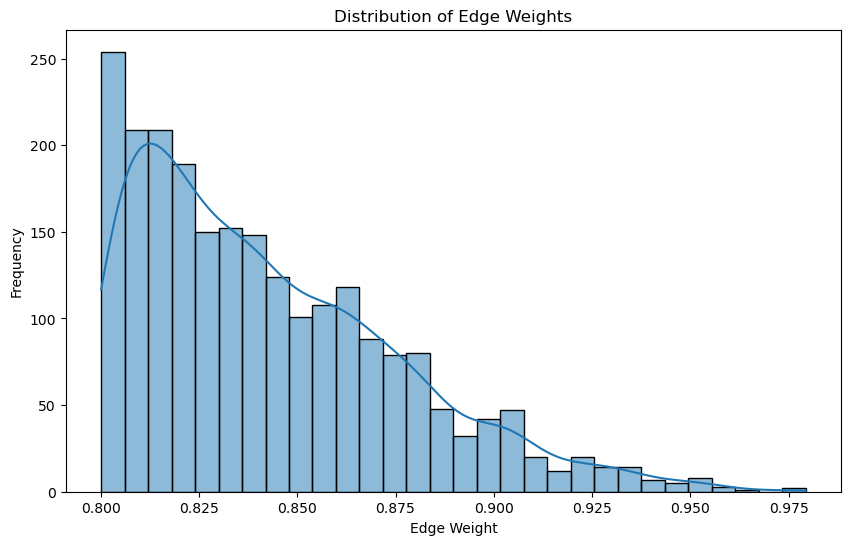

In [125]:
# Visualize the distribution of edge weights
visualize_edge_weight_distribution(pearson_graph_pruned)

In [140]:
def analyze_and_plot_density(graph):
    """
    Calculates and plots the density of the graph for a predefined series of thresholds.

    Parameters:
    graph (nx.Graph): The original NetworkX graph.

    Returns:
    densities (list of float): Densities of the graph at each threshold.
    """
    thresholds = [0.7 + i * 0.01 for i in range(31)]
    densities = []

    for threshold in thresholds:
        filtered_edges = [(u, v) for u, v, d in graph.edges(data=True) if d['weight'] > threshold]
        temp_graph = nx.Graph()
        temp_graph.add_edges_from(filtered_edges)
        densities.append(nx.density(temp_graph))

    # Plot the densities
    plt.figure(figsize=(10, 6))
    plt.plot(thresholds, densities, marker='o')
    plt.xlabel('Threshold')
    plt.ylabel('Density')
    plt.title('Density vs. Threshold')
    plt.grid(True)
    plt.show()

    return densities

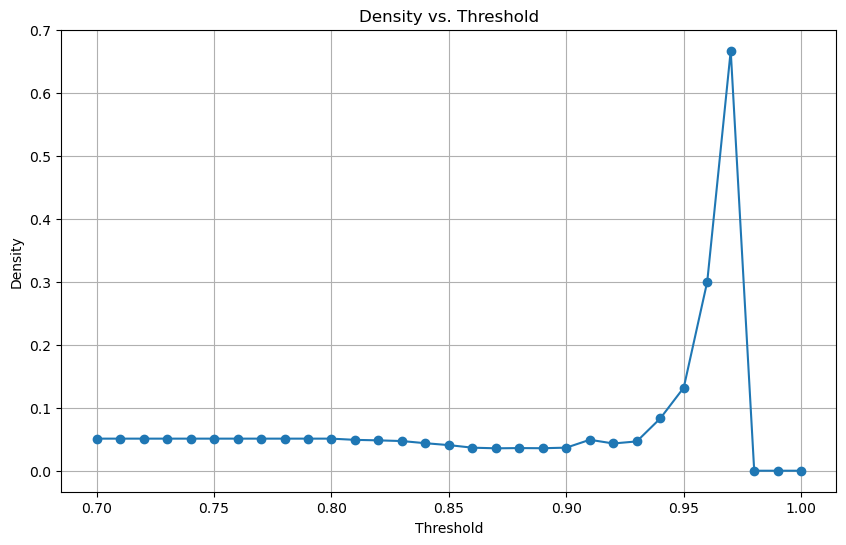

In [141]:
densities = analyze_and_plot_density(pearson_graph_pruned)

In [142]:
import networkx as nx
import matplotlib.pyplot as plt
import random

# Define the sparsification functions
def threshold_sparsification(graph, threshold):
    """
    Sparsifies the graph by removing edges below the specified weight threshold.

    Parameters:
    graph (nx.Graph): The original NetworkX graph.
    threshold (float): The weight threshold.

    Returns:
    nx.Graph: The sparsified graph.
    """
    sparsified_graph = nx.Graph()
    sparsified_graph.add_nodes_from(graph.nodes(data=True))
    sparsified_graph.add_edges_from((u, v, d) for u, v, d in graph.edges(data=True) if d['weight'] >= threshold)
    return sparsified_graph

def top_percentage_sparsification(graph, top_percentage):
    """
    Sparsifies the graph by keeping the top percentage of edges by weight.

    Parameters:
    graph (nx.Graph): The original NetworkX graph.
    top_percentage (float): The percentage of top-weight edges to keep.

    Returns:
    nx.Graph: The sparsified graph.
    """
    sorted_edges = sorted(graph.edges(data=True), key=lambda x: x[2]['weight'], reverse=True)
    top_edges_count = int(len(sorted_edges) * (top_percentage / 100))
    sparsified_graph = nx.Graph()
    sparsified_graph.add_nodes_from(graph.nodes(data=True))
    sparsified_graph.add_edges_from(sorted_edges[:top_edges_count])
    return sparsified_graph

def remove_by_closeness(graph, threshold):
    """
    Sparsifies the graph by removing nodes with closeness centrality below the specified threshold.

    Parameters:
    graph (nx.Graph): The original NetworkX graph.
    threshold (float): The closeness centrality threshold.

    Returns:
    nx.Graph: The sparsified graph.
    """
    closeness = nx.closeness_centrality(graph)
    # Create a copy to modify
    modified_graph = graph.copy()
    for gene, centrality in closeness.items():
        if centrality < threshold:
            modified_graph.remove_node(gene)
    return modified_graph

def remove_by_degree(graph, min_degree):
    """
    Sparsifies the graph by removing nodes with degree below the specified threshold.

    Parameters:
    graph (nx.Graph): The original NetworkX graph.
    min_degree (int): The minimum degree threshold.

    Returns:
    nx.Graph: The sparsified graph.
    """
    degrees = dict(graph.degree())
    # Create a copy to modify
    modified_graph = graph.copy()
    for gene, degree in degrees.items():
        if degree < min_degree:
            modified_graph.remove_node(gene)
    return modified_graph

def knn_sparsification(graph, k):
    """
    Sparsifies the graph by keeping only the top-k edges with the highest weights for each node.

    Parameters:
    graph (nx.Graph): The original NetworkX graph.
    k (int): The number of nearest neighbors to keep for each node.

    Returns:
    nx.Graph: The sparsified graph.
    """
    sparsified_graph = nx.Graph()
    sparsified_graph.add_nodes_from(graph.nodes(data=True))
    
    for node in graph.nodes():
        edges = sorted(graph.edges(node, data=True), key=lambda x: x[2]['weight'], reverse=True)
        sparsified_graph.add_edges_from(edges[:k])
    
    return sparsified_graph

def spanning_tree_sparsification(graph):
    """
    Sparsifies the graph by creating a minimum spanning tree.

    Parameters:
    graph (nx.Graph): The original NetworkX graph.

    Returns:
    nx.Graph: The sparsified graph.
    """
    sparsified_graph = nx.minimum_spanning_tree(graph, weight='weight')
    return sparsified_graph


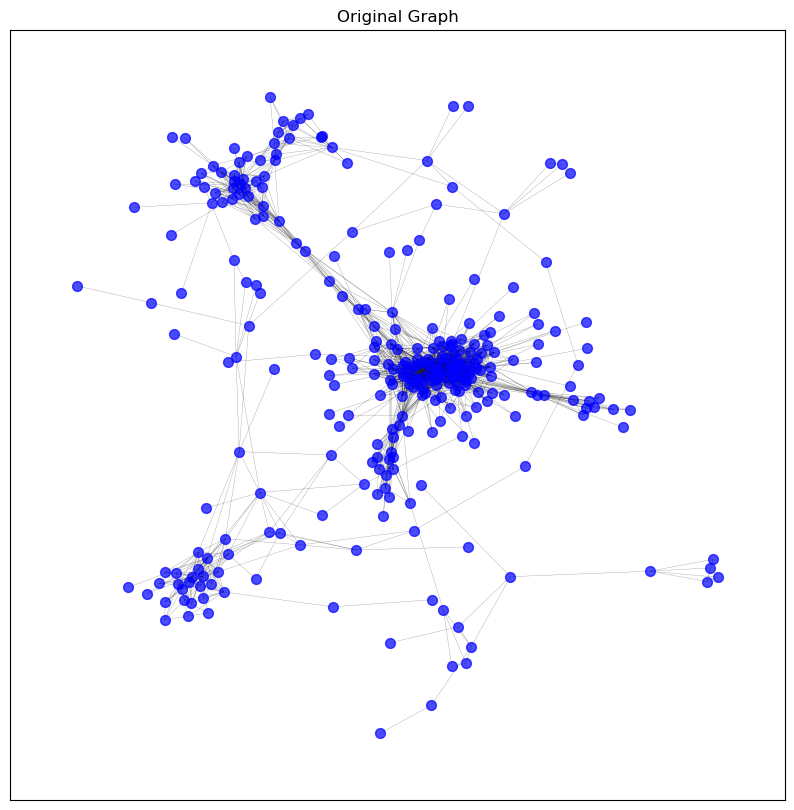

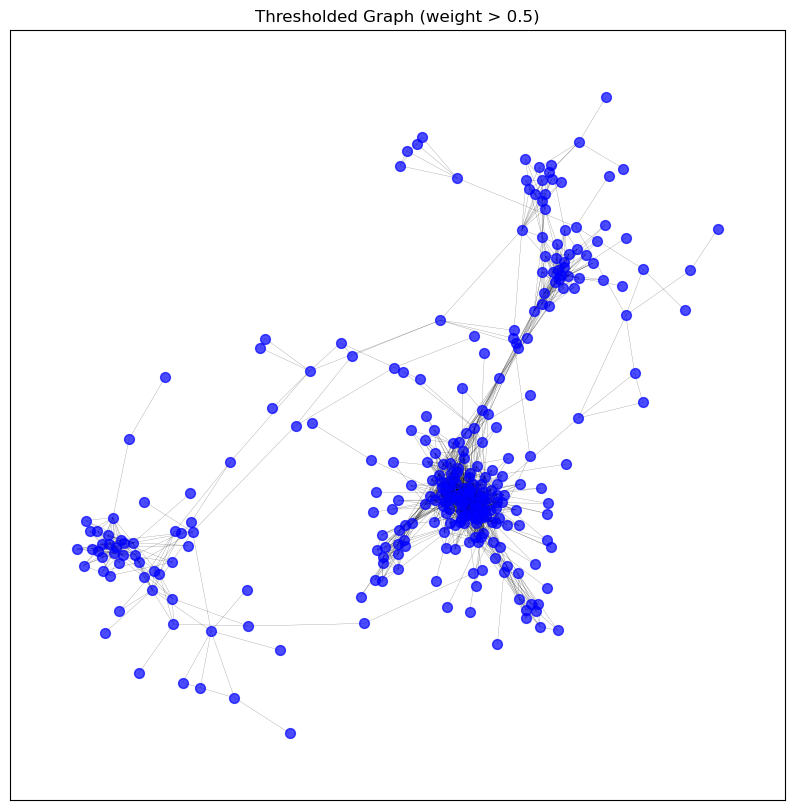

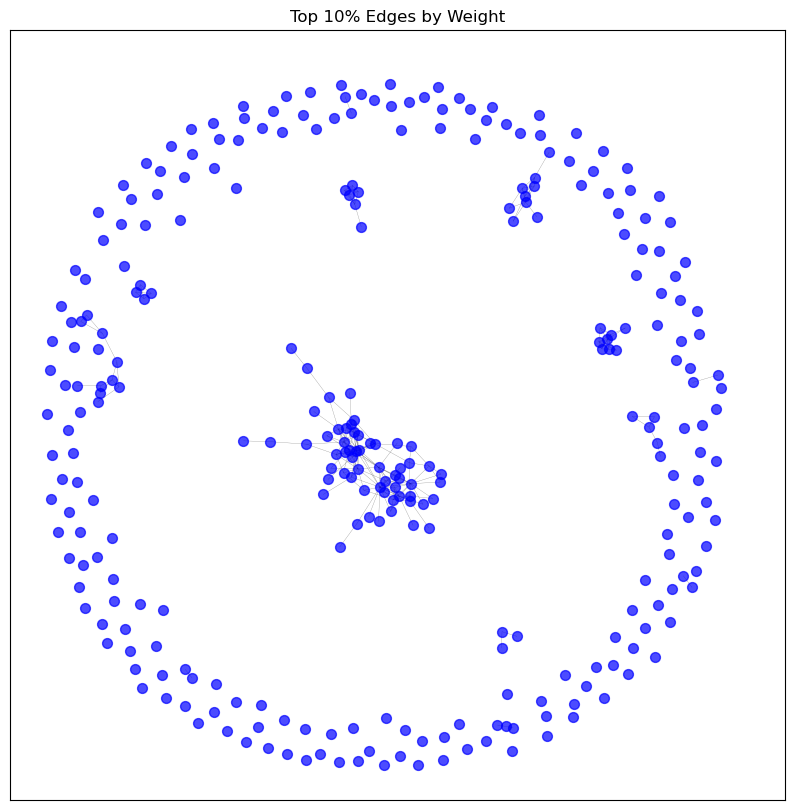

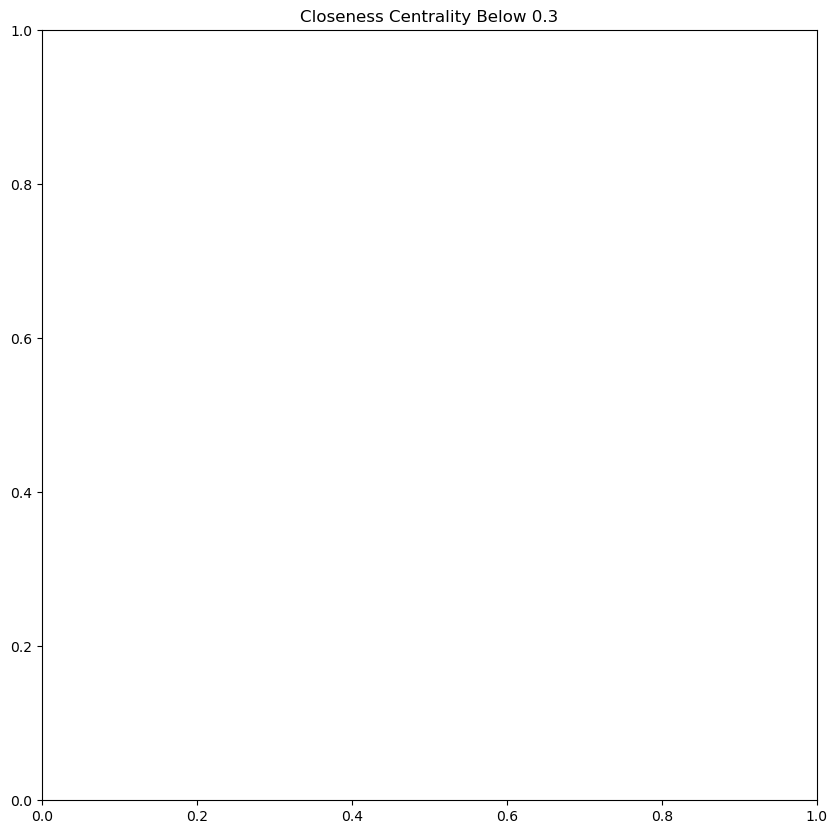

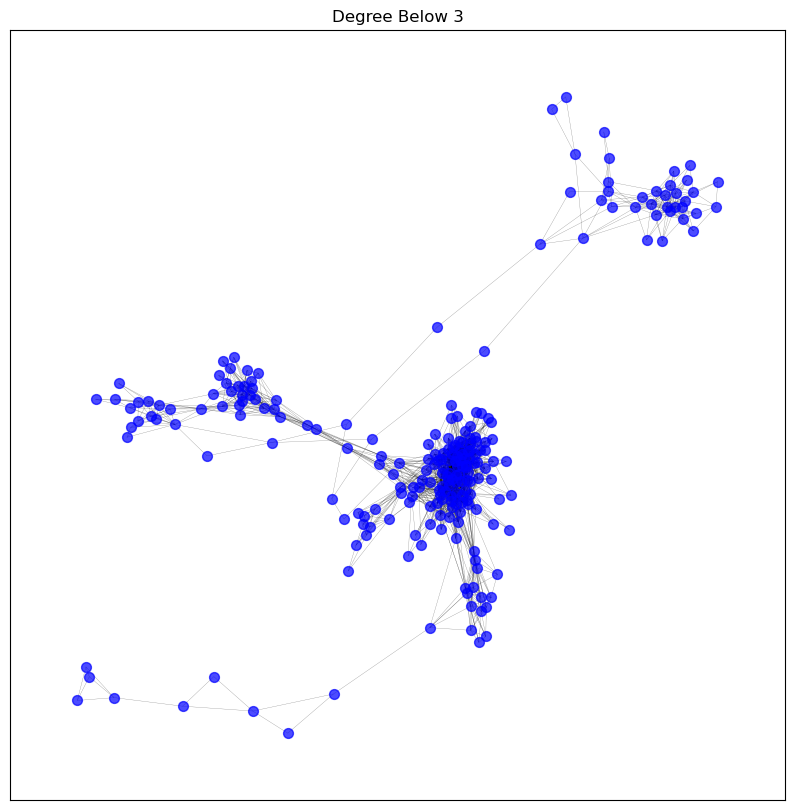

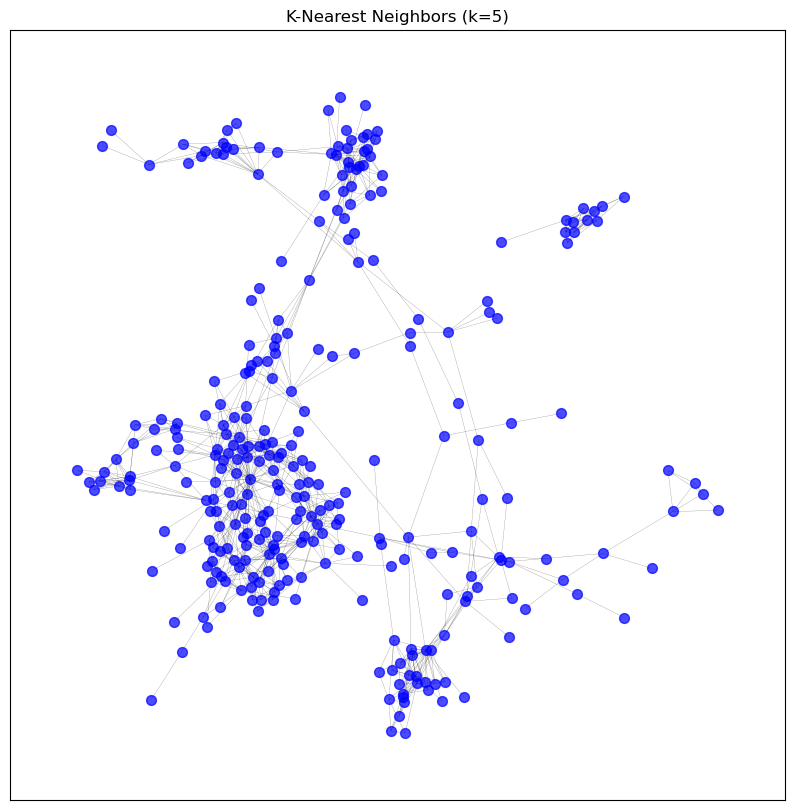

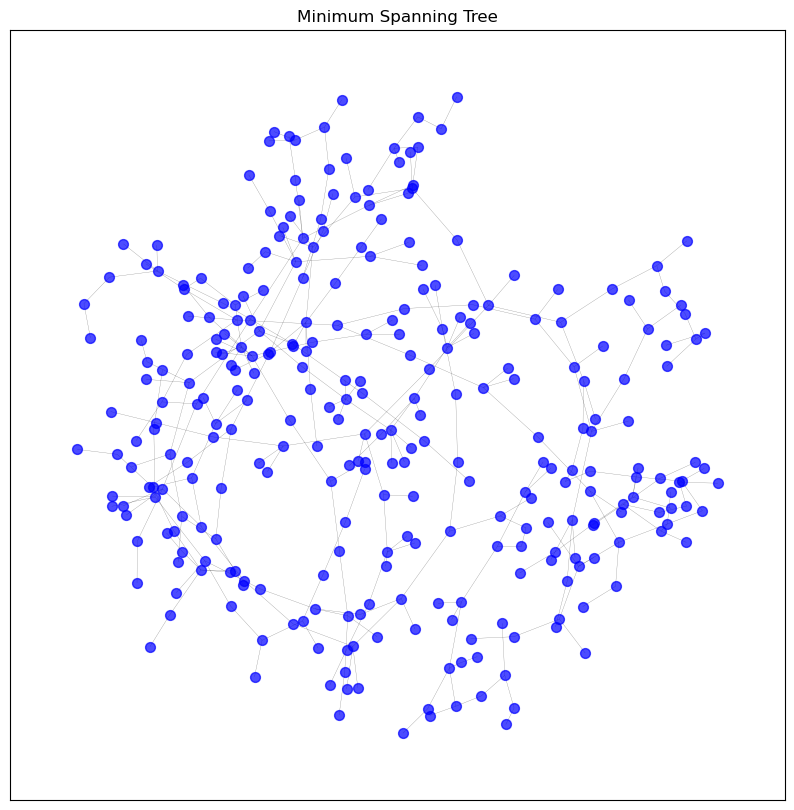

In [190]:
# Initialize a dictionary to store graphs
graphs = {}
graphs['original'] = pearson_graph_pruned.copy()  # Store the original graph

# Apply sparsification methods
graphs['threshold_0.5'] = threshold_sparsification(graphs['original'], threshold=0.5)
graphs['top_10_percent'] = top_percentage_sparsification(graphs['original'], top_percentage=10)
graphs['closeness_below_0.3'] = remove_by_closeness(graphs['original'], threshold=0.3)
graphs['degree_below_3'] = remove_by_degree(graphs['original'], min_degree=3)
graphs['knn_5'] = knn_sparsification(graphs['original'], k=5)
graphs['spanning_tree'] = spanning_tree_sparsification(graphs['original'])


# Example visualization
visualize_graph(graphs['original'], 'Original Graph')
visualize_graph(graphs['threshold_0.5'], 'Thresholded Graph (weight > 0.5)')
visualize_graph(graphs['top_10_percent'], 'Top 10% Edges by Weight')
visualize_graph(graphs['closeness_below_0.3'], 'Closeness Centrality Below 0.3')
visualize_graph(graphs['degree_below_3'], 'Degree Below 3')
visualize_graph(graphs['knn_5'], 'K-Nearest Neighbors (k=5)')
visualize_graph(graphs['spanning_tree'], 'Minimum Spanning Tree')


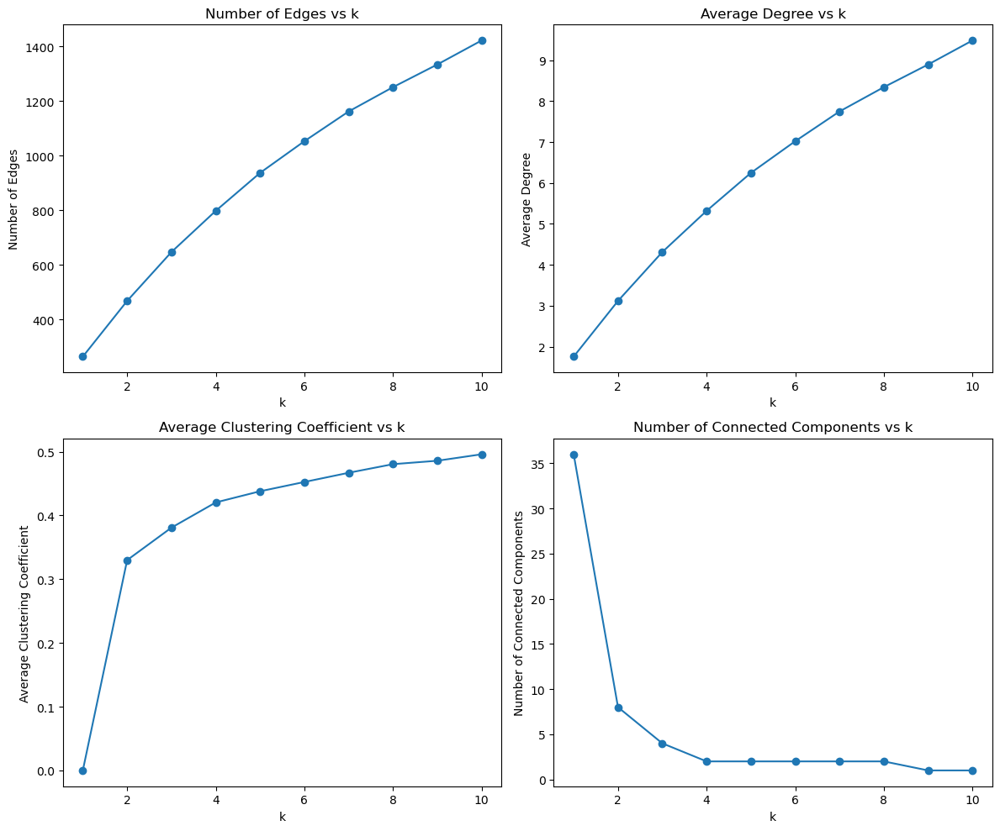

In [178]:
def analyze_knn_effect(graph, k_values):
    """
    Analyzes the effect of different k values on the network properties.

    Parameters:
    graph (nx.Graph): The original NetworkX graph.
    k_values (list): List of k values to use for sparsification.

    Returns:
    pd.DataFrame: DataFrame containing the analysis results.
    """
    results = {
        'k': [],
        'num_edges': [],
        'avg_degree': [],
        'avg_clustering': [],
        'num_connected_components': [],
    }
    
    for k in k_values:
        sparsified_graph = knn_sparsification(graph, k)
        num_edges = sparsified_graph.number_of_edges()
        avg_degree = sum(dict(sparsified_graph.degree()).values()) / sparsified_graph.number_of_nodes()
        avg_clustering = nx.average_clustering(sparsified_graph)
        num_connected_components = nx.number_connected_components(sparsified_graph)
        
        results['k'].append(k)
        results['num_edges'].append(num_edges)
        results['avg_degree'].append(avg_degree)
        results['avg_clustering'].append(avg_clustering)
        results['num_connected_components'].append(num_connected_components)
    
    return pd.DataFrame(results)

def plot_knn_analysis(df):
    """
    Plots the analysis of the effect of different k values on network properties.

    Parameters:
    df (pd.DataFrame): DataFrame containing the analysis results.
    """
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    
    axes[0, 0].plot(df['k'], df['num_edges'], marker='o')
    axes[0, 0].set_title('Number of Edges vs k')
    axes[0, 0].set_xlabel('k')
    axes[0, 0].set_ylabel('Number of Edges')
    
    axes[0, 1].plot(df['k'], df['avg_degree'], marker='o')
    axes[0, 1].set_title('Average Degree vs k')
    axes[0, 1].set_xlabel('k')
    axes[0, 1].set_ylabel('Average Degree')
    
    axes[1, 0].plot(df['k'], df['avg_clustering'], marker='o')
    axes[1, 0].set_title('Average Clustering Coefficient vs k')
    axes[1, 0].set_xlabel('k')
    axes[1, 0].set_ylabel('Average Clustering Coefficient')
    
    axes[1, 1].plot(df['k'], df['num_connected_components'], marker='o')
    axes[1, 1].set_title('Number of Connected Components vs k')
    axes[1, 1].set_xlabel('k')
    axes[1, 1].set_ylabel('Number of Connected Components')
    
    plt.tight_layout()
    plt.show()

# Example usage
# Assuming pearson_graph is your NetworkX graph
k_values = list(range(1, 11))  # Different k values to analyze
analysis_results = analyze_knn_effect(graphs['original'], k_values)

# Plot the analysis results
plot_knn_analysis(analysis_results)

In [176]:
import mygene
import networkx as nx

def get_highest_degree_nodes(graph, top_n=10):
    """
    Returns the nodes with the highest degree in the graph.

    Parameters:
    graph (nx.Graph): The NetworkX graph.
    top_n (int): The number of top nodes to return.

    Returns:
    List of tuples: Each tuple contains a node and its degree.
    """
    degrees = dict(graph.degree())
    sorted_degrees = sorted(degrees.items(), key=lambda x: x[1], reverse=True)
    return sorted_degrees[:top_n]

def fetch_gene_info(gene_list):
    """
    Fetches gene information from MyGene.info.

    Parameters:
    gene_list (list): List of gene symbols or Ensembl IDs.

    Returns:
    list: List of dictionaries containing gene information.
    """
    mg = mygene.MyGeneInfo()
    gene_info = mg.querymany(gene_list, scopes='symbol,ensembl.gene', 
                             fields='name,symbol,entrezgene,summary,disease,pathway', 
                             species='human')
    return gene_info

def print_gene_info_with_degree(top_genes_with_degrees, gene_info):
    """
    Prints gene information including the degree.

    Parameters:
    top_genes_with_degrees (list): List of tuples containing gene symbols and their degrees.
    gene_info (list): List of dictionaries containing gene information.
    """
    for gene, degree in top_genes_with_degrees:
        info = next((item for item in gene_info if item['query'] == gene), None)
        if info:
            print(f"Gene Symbol: {info.get('symbol', 'N/A')}")
            print(f"Degree: {degree}")
            print(f"Gene Name: {info.get('name', 'N/A')}")
            print(f"Entrez ID: {info.get('entrezgene', 'N/A')}")
            print(f"Summary: {info.get('summary', 'N/A')}")
            if 'disease' in info:
                diseases = ', '.join([d['term'] for d in info['disease']])
                print(f"Diseases: {diseases}")
            else:
                print("Diseases: N/A")
            if 'pathway' in info:
                pathways = []
                if isinstance(info['pathway'], dict):
                    for key in info['pathway']:
                        pathway_data = info['pathway'][key]
                        if isinstance(pathway_data, list):
                            pathways.extend([p['name'] for p in pathway_data if 'name' in p])
                        elif isinstance(pathway_data, dict) and 'name' in pathway_data:
                            pathways.append(pathway_data['name'])
                        elif isinstance(pathway_data, str):
                            pathways.append(pathway_data)
                print(f"Pathways: {', '.join(pathways) if pathways else 'N/A'}")
            else:
                print("Pathways: N/A")
            print("-" * 40)
        else:
            print(f"Gene not found: {gene}")
            print(f"Degree: {degree}")
            print("-" * 40)

# Example usage
# Assuming patient_network is your NetworkX graph
top_genes_with_degrees = get_highest_degree_nodes(pearson_graph_pruned, top_n=10)
gene_symbols = [gene for gene, degree in top_genes_with_degrees]

# Fetch gene information
gene_info = fetch_gene_info(gene_symbols)

# Print gene information including degree
print_gene_info_with_degree(top_genes_with_degrees, gene_info)


Gene Symbol: NCKAP1L
Degree: 84
Gene Name: NCK associated protein 1 like
Entrez ID: 3071
Summary: This gene encodes a member of the HEM family of tissue-specific transmembrane proteins which are highly conserved from invertebrates through mammals. This gene is only expressed in hematopoietic cells. The encoded protein is a part of the Scar/WAVE complex which plays an important role in regulating cell shape in both metazoans and plants. Alternatively spliced transcript variants encoding different isoforms have been found.[provided by RefSeq, May 2010].
Diseases: N/A
Pathways: Regulation of actin cytoskeleton - Homo sapiens (human), Pathogenic Escherichia coli infection - Homo sapiens (human), Salmonella infection - Homo sapiens (human), Signal Transduction, Signal Transduction, Disease, Disease, Innate Immune System, Innate Immune System, Immune System, Immune System, Signaling by VEGF, Signaling by Rho GTPases, Signaling by Rho GTPases, RHO GTPase Effectors, RHO GTPase Effectors, Fcgam

# Interactive Visualization

In [51]:
def visualize_interactive_network(graph, output_file='network.html'):
    """
    Visualizes a NetworkX graph interactively using PyVis.

    Parameters:
    graph (nx.Graph): The NetworkX graph to visualize.
    output_file (str): The filename for the output HTML file.
    """
    net = Network(notebook=True, width="100%", height="1000px")
    net.from_nx(graph)
    net.show(output_file)


In [161]:
# Visualize the graph interactively
visualize_interactive_network(p_pearson_graph_pruned, output_file='pearson_network.html')

Local cdn resources have problems on chrome/safari when used in jupyter-notebook. 


In [158]:
import networkx as nx
import plotly.graph_objects as go
import plotly.io as pio

def save_interactive_network_plotly(graph, output_file='network.html', title="Interactive Network"):
    # Extract node positions
    pos = nx.spring_layout(graph)

    # Extract edges
    edge_x = []
    edge_y = []
    for edge in graph.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.5, color='#888'),
        hoverinfo='none',
        mode='lines')

    # Extract nodes
    node_x = []
    node_y = []
    node_text = []
    for node in graph.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_text.append(str(node))

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers+text',
        text=node_text,
        hoverinfo='text',
        marker=dict(
            showscale=True,
            colorscale='YlGnBu',
            size=10,
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            ),
        )
    )

    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(
                        title=title,
                        titlefont_size=16,
                        showlegend=False,
                        hovermode='closest',
                        margin=dict(b=20,l=5,r=5,t=40),
                        annotations=[ dict(
                            text="",
                            showarrow=False,
                            xref="paper", yref="paper"
                        )],
                        xaxis=dict(showgrid=False, zeroline=False),
                        yaxis=dict(showgrid=False, zeroline=False))
                    )

    # Save the figure to an HTML file
    pio.write_html(fig, file=output_file, auto_open=True)

In [160]:
# Example usage
# Assuming patient_network is your NetworkX graph
save_interactive_network_plotly(p_pearson_graph_pruned, output_file='patient_similarity_network.html', title="Patient Similarity Network")


In [162]:
save_interactive_network_plotly(pearson_graph_pruned, output_file='gene_similarity_network.html', title="Patient Similarity Network")


# Storing generated networks

In [ ]:
#example
nx.write_gml(G, 'gene_coexpression_network.gml')


# Patient similarity network

In [146]:
# Based on the same expression matrix we can create a patient similarity network.
# By transposing the matrix will switch the rows and columns,
# meaning that patients will become the rows and genes will become the columns.
# By doing this, you can compute the correlation (or similarity) between patients based on their gene expression profiles,
# and then create a network where nodes represent patients and edges represent similarities.

In [147]:
# Transpose the matrix
patient_gene_matrix = df_renamed.T

In [148]:
# Dictionary to store different correlation matrices
p_correlation_matrices = {}

# Pearson correlation
p_correlation_matrices['pearson'] = patient_gene_matrix.corr(method='pearson')

p_correlation_matrices['biweight_midcorrelation'] = abs_bicorr(patient_gene_matrix)

In [149]:
p_pearson_graph = create_graph_from_correlation(p_correlation_matrices['pearson'], threshold=0.1)

In [150]:
verify_edge_weights(p_pearson_graph, num_samples=10)

Sample of 10 edges with weights:
Edge (TCGA-38-7271, TCGA-73-4658) - weight: 0.8096370252553636
Edge (TCGA-38-7271, TCGA-49-6744) - weight: 0.8666451950864088
Edge (TCGA-38-7271, TCGA-78-8648) - weight: 0.8166297005921491
Edge (TCGA-38-7271, TCGA-99-8028) - weight: 0.8198508461567025
Edge (TCGA-38-7271, TCGA-86-8280) - weight: 0.8136441647877977
Edge (TCGA-38-7271, TCGA-50-5941) - weight: 0.8103323608706653
Edge (TCGA-38-7271, TCGA-86-8671) - weight: 0.8252323552539674
Edge (TCGA-38-7271, TCGA-99-AA5R) - weight: 0.8038829011309335
Edge (TCGA-38-7271, TCGA-50-8457) - weight: 0.8022850320798239
Edge (TCGA-38-7271, TCGA-44-2657) - weight: 0.811479576749465


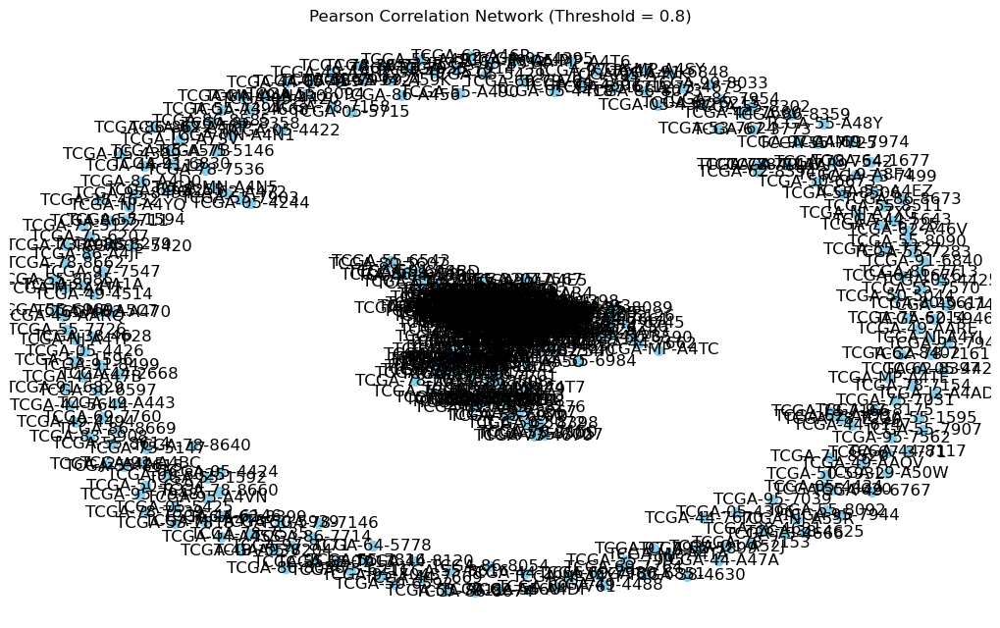

In [151]:
visualize_graph(p_pearson_graph, title='Pearson Correlation Network (Threshold = 0.8)')

In [152]:
# Clean the graph by removing unconnected nodes
p_pearson_graph_pruned = clean_graph(p_pearson_graph,
                                    degree_threshold=1,
                                    keep_largest_component=True)

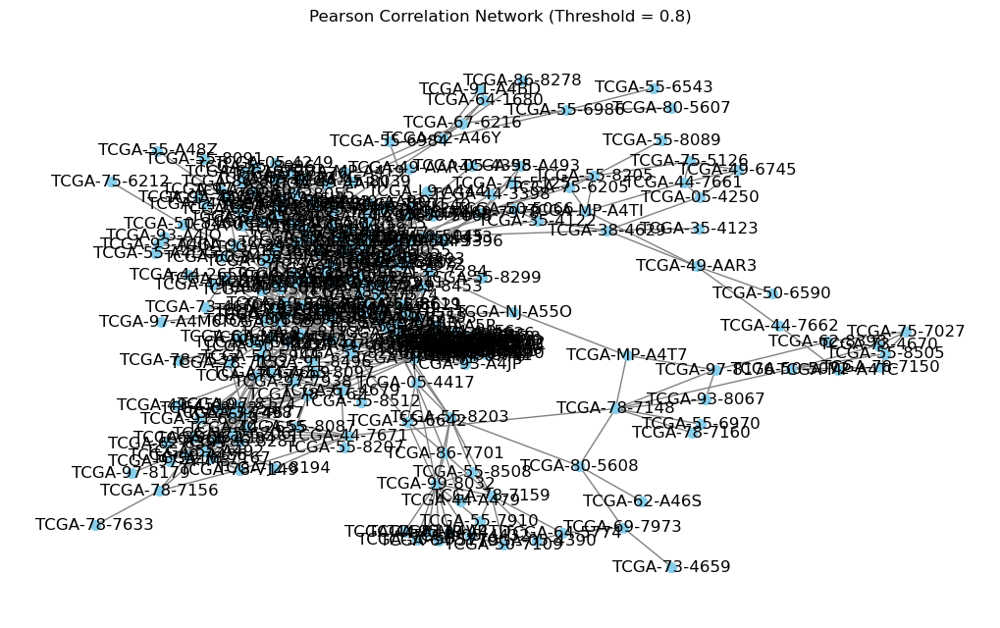

In [153]:
visualize_graph(p_pearson_graph_pruned, title='Pearson Correlation Network (Threshold = 0.8)')

In [202]:
print_graph_info(p_pearson_graph_pruned)

Number of nodes: 265
Number of edges: 1341
Sample nodes: ['TCGA-38-7271', 'TCGA-73-4658', 'TCGA-86-8076', 'TCGA-44-2661', 'TCGA-73-4662', 'TCGA-44-7671', 'TCGA-55-6978', 'TCGA-55-6986', 'TCGA-49-6744', 'TCGA-75-5125']
Sample edges: [('TCGA-38-7271', 'TCGA-73-4658', {'width': 0.8096370252553636}), ('TCGA-38-7271', 'TCGA-49-6744', {'width': 0.8666451950864088}), ('TCGA-38-7271', 'TCGA-78-8648', {'width': 0.8166297005921491}), ('TCGA-38-7271', 'TCGA-99-8028', {'width': 0.8198508461567025}), ('TCGA-38-7271', 'TCGA-86-8280', {'width': 0.8136441647877977}), ('TCGA-38-7271', 'TCGA-50-5941', {'width': 0.8103323608706653}), ('TCGA-38-7271', 'TCGA-86-8671', {'width': 0.8252323552539674}), ('TCGA-38-7271', 'TCGA-99-AA5R', {'width': 0.8038829011309335}), ('TCGA-38-7271', 'TCGA-50-8457', {'width': 0.8022850320798239}), ('TCGA-38-7271', 'TCGA-44-2657', {'width': 0.811479576749465})]


In [201]:
nx.write_gml(p_pearson_graph_pruned, 'patient_coexpression_network.gml')

In [51]:
# Normalizing data - Log transformation
# Adding a pseudocount to avoid log(0) which is undefined
def log_transform(data):
    # Log transformation (log2(x + 1))
    return np.log2(data + 1)

def min_max_scale(data):
    # Min-Max scaling
    return (data - data.min()) / (data.max() - data.min())

In [52]:
# Dictionary to store different correlation matrices
correlation_matrices = {}

# Original data correlation (if applicable/necessary)
correlation_matrices['original'] = df_renamed.corr(method='pearson')

In [ ]:
# Log transformed data correlation
normalized_log = log_transform(data)
correlation_matrices['log_transformed'] = normalized_log.corr(method='pearson')

# Min-Max scaled data correlation
normalized_min_max = min_max_scale(data)
correlation_matrices['min_max_scaled'] = normalized_min_max.corr(method='pearson')

# Access and use a specific correlation matrix
print("Correlation matrix - Log Transformed:")
#print(correlation_matrices['log_transformed'])

In [ ]:
# Spearman correlation
from scipy.spatial.distance import pdist, squareform


correlation_matrices['spearman'] = data.corr(method='spearman')

# Euclidean distance - converting distance matrix to a DataFrame for compatibility
euclidean_distances = squareform(pdist(data, metric='euclidean'))
correlation_matrices['euclidean'] = pd.DataFrame(euclidean_distances, index=data.index, columns=data.index)

# Now you can access and use the Spearman correlation matrix or the Euclidean distance matrix
print("Spearman Correlation Matrix:")
#print(correlation_matrices['spearman'])

print("\nEuclidean Distance Matrix:")
#print(correlation_matrices['euclidean'])


In [14]:
# List columns that start with "__"
prefix = "__"
columns_starting_with_prefix = [col for col in df.columns if col.startswith(prefix)]

# Print the results
print("Columns starting with '__':")
print(columns_starting_with_prefix)

Columns starting with '__':
['__no_feature', '__ambiguous', '__too_low_aQual', '__not_aligned', '__alignment_not_unique']


In [15]:
# drop weird columns
data.drop(columns = columns_starting_with_prefix, inplace=True)

In [6]:
correlation_matrices = {}
correlation_matrices['original'] = data.corr(method='pearson')


# TODO: what kind of clustering happens in the following heatmaps

KeyError: 'log_transformed'

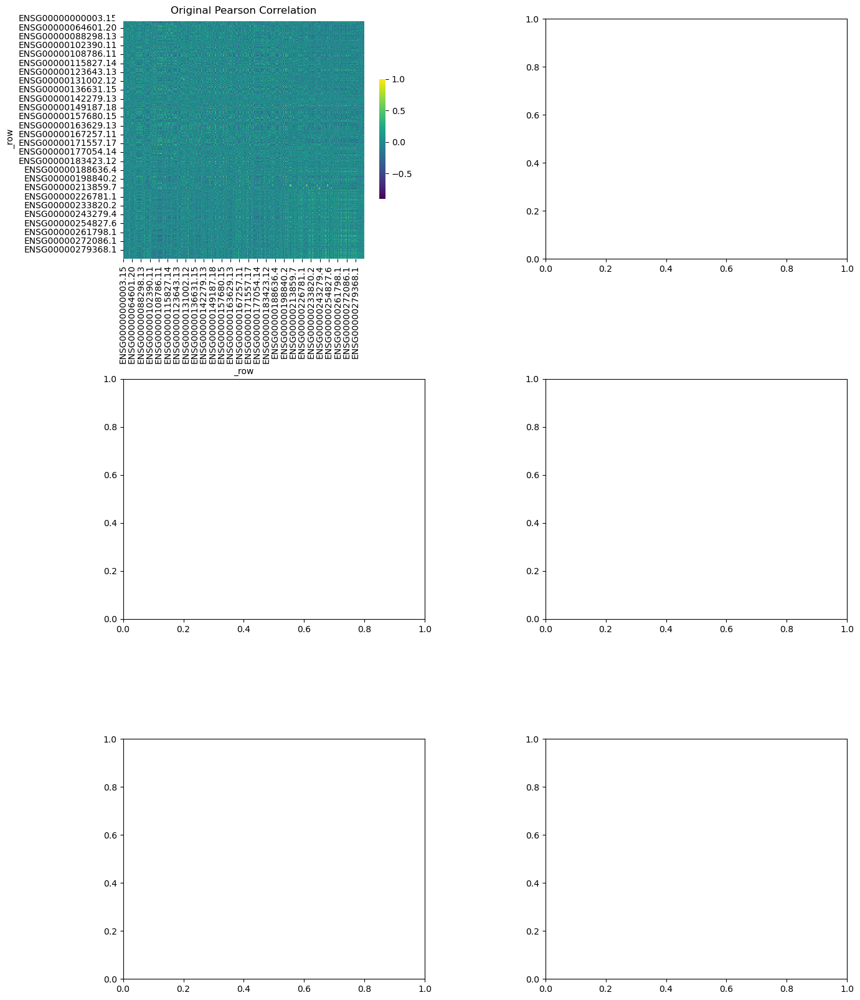

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_matrix(matrix, title, ax):
    # Heatmap of the correlation or distance matrix
    sns.heatmap(matrix, ax=ax, cmap='viridis', cbar_kws={'shrink': .5}, annot=True, fmt=".2f")
    ax.set_title(title)

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 20))
fig.subplots_adjust(hspace=0.5, wspace=0.4)

# Plot each matrix
plot_matrix(correlation_matrices['original'], 'Original Pearson Correlation', axes[0, 0])
plot_matrix(correlation_matrices['log_transformed'], 'Log Transformed Pearson Correlation', axes[0, 1])
plot_matrix(correlation_matrices['min_max_scaled'], 'Min-Max Scaled Pearson Correlation', axes[1, 0])
plot_matrix(correlation_matrices['spearman'], 'Spearman Correlation', axes[1, 1])
plot_matrix(correlation_matrices['euclidean'], 'Euclidean Distance', axes[2, 0])

# Hide the unused subplot (if any)
axes[2, 1].set_visible(False)

plt.show()

In [7]:
# Alternatively use WGCNA ?
# https://github.com/mortazavilab/PyWGCNA?tab=readme-ov-file
# https://en.wikipedia.org/wiki/Weighted_correlation_network_analysis#:~:text=Weighted%20correlation%20network%20analysis%2C%20also,on%20pairwise%20correlations%20between%20variables.

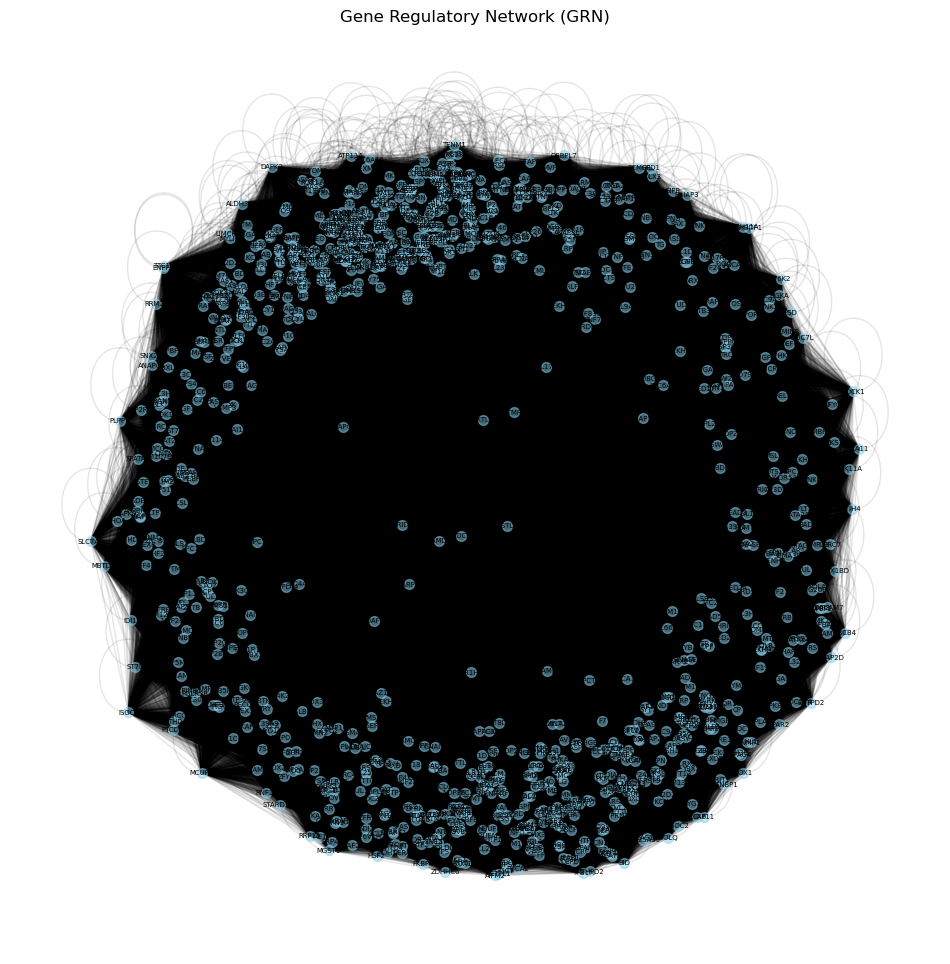

In [53]:
# Create a graph from the adjacency matrix
G = nx.from_pandas_adjacency(correlation_matrices['original'])

# Plot the network
plt.figure(figsize=(12, 12))
# Position nodes using the spring layout algorithm for nice aesthetics
pos = nx.spring_layout(G)
# Draw nodes and edges
nx.draw_networkx_nodes(G, pos, node_color='skyblue', alpha=0.5, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.1)
# Draw node labels
nx.draw_networkx_labels(G, pos, font_size=5, font_family='sans-serif')

# Remove the axis
plt.axis('off')
plt.title('Gene Regulatory Network (GRN)')
plt.show()

In [30]:
correlation_matrices['original']

Patient_ID,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000155621,ENSG00000155622,ENSG00000155629,ENSG00000155636,ENSG00000155640,ENSG00000155657,ENSG00000155659,ENSG00000155660,ENSG00000155666,ENSG00000155714
Patient_ID,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,1.000000,-0.042486,0.298026,0.223362,0.291175,0.305384,0.423688,0.658827,0.462417,0.432857,...,0.353418,NaN,0.481082,0.283031,0.052522,0.246133,0.453718,0.339164,-0.164747,-0.096215
ENSG00000000005,-0.042486,1.000000,0.177769,0.162953,-0.112138,0.003452,0.035166,0.039170,-0.020925,-0.210681,...,-0.273364,NaN,0.044157,-0.032397,-0.008614,-0.001983,0.010526,-0.111242,-0.028133,0.143119
ENSG00000000419,0.298026,0.177769,1.000000,0.597557,0.093545,-0.007350,0.067359,0.335385,0.428808,0.222787,...,0.167196,NaN,0.181603,0.297941,0.111203,-0.171529,0.062529,0.359968,0.163283,0.165181
ENSG00000000457,0.223362,0.162953,0.597557,1.000000,0.277404,-0.159248,-0.048439,0.203196,0.380732,-0.009258,...,-0.040278,NaN,0.005829,0.476490,0.187316,-0.156072,-0.020087,-0.038488,0.480332,0.239516
ENSG00000000460,0.291175,-0.112138,0.093545,0.277404,1.000000,0.242848,0.223986,0.484996,0.109299,0.368052,...,0.340127,NaN,0.402731,0.459763,0.238576,0.000228,0.440603,0.246293,0.382062,0.123713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000155657,0.246133,-0.001983,-0.171529,-0.156072,0.000228,-0.035157,0.076859,-0.024595,0.082845,0.153609,...,0.086302,NaN,-0.077452,0.117541,0.213879,1.000000,-0.100157,-0.023396,-0.007390,-0.009455
ENSG00000155659,0.453718,0.010526,0.062529,-0.020087,0.440603,0.749756,0.537771,0.726786,0.009087,0.197822,...,0.086919,NaN,0.944830,0.059042,0.239810,-0.100157,1.000000,0.462384,-0.123507,0.052848
ENSG00000155660,0.339164,-0.111242,0.359968,-0.038488,0.246293,0.671194,0.495571,0.649149,0.234953,0.475681,...,0.339656,NaN,0.621980,-0.089353,0.261522,-0.023396,0.462384,1.000000,-0.149444,0.131492


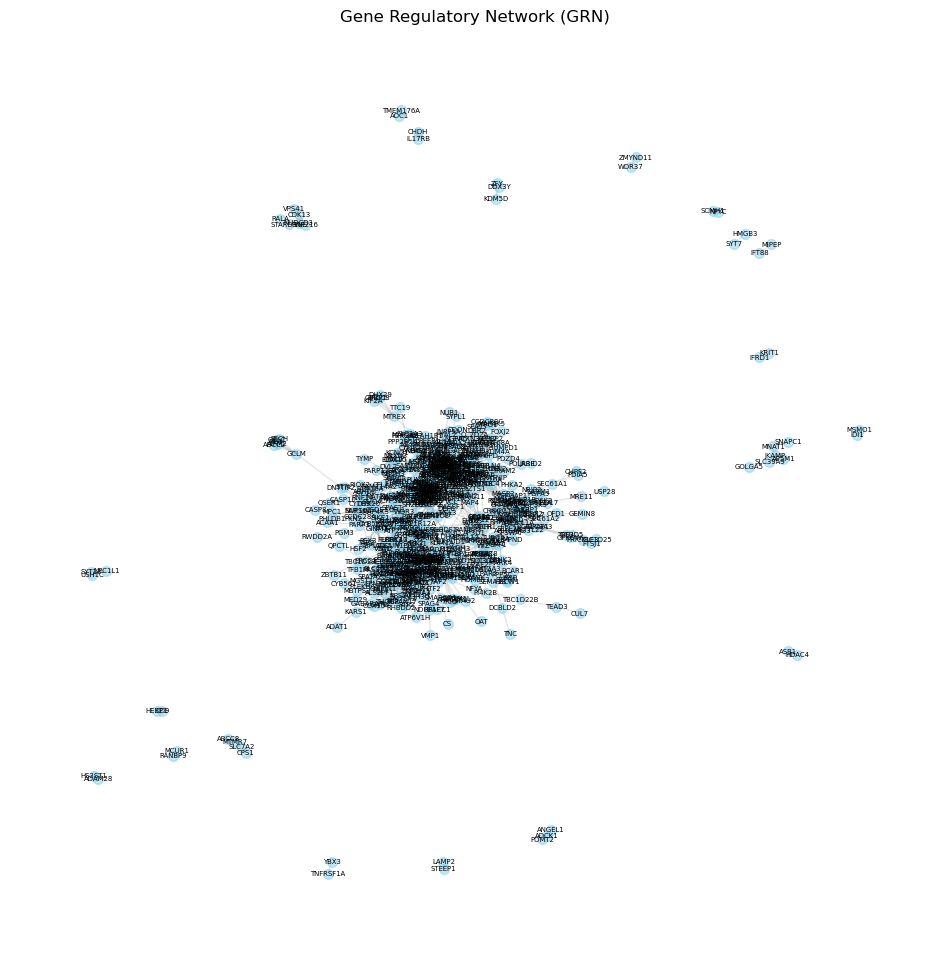

In [55]:
# Assuming 'filtered_correlation_matrix' is your thresholded correlation matrix from previous steps
threshold = 0.5
# Convert the filtered correlation matrix into an adjacency matrix for the graph
# We consider correlations above the threshold as edges in the network

# Create an identity matrix of the same size as the correlation matrix
identity_matrix = np.eye(len(correlation_matrices['original']))

# Create the adjacency matrix by converting the correlation matrix to binary based on the threshold
# and subtracting the identity matrix to remove self-connections
adjacency_matrix = (correlation_matrices['original'] > threshold).astype(int) - identity_matrix

# Convert adjacency matrix to an integer type, if necessary
adjacency_matrix = adjacency_matrix.astype(int)

# Ensure no negative values after subtraction (in case of numerical issues)
adjacency_matrix[adjacency_matrix < 0] = 0

# Replace zeros with NaN
adjacency_matrix.replace(0, np.nan, inplace=True)

# Drop all rows and columns that only contain NaN
adjacency_matrix.dropna(axis=0, how='all', inplace=True)  # Drop rows that have all NaN
adjacency_matrix.dropna(axis=1, how='all', inplace=True)  # Drop columns that have all NaN

# Optionally, replace NaNs back with zeros if needed for other processing
adjacency_matrix.fillna(0, inplace=True)

#adjacency_matrix = (correlation_matrix > threshold).astype(int)-np.eye
# print(adjacency_matrix)

# Create a graph from the adjacency matrix
G = nx.from_pandas_adjacency(adjacency_matrix)

# Plot the network
plt.figure(figsize=(12, 12))
# Position nodes using the spring layout algorithm for nice aesthetics
pos = nx.spring_layout(G)
# Draw nodes and edges
nx.draw_networkx_nodes(G, pos, node_color='skyblue', alpha=0.5, node_size=50)
nx.draw_networkx_edges(G, pos, alpha=0.1)
# Draw node labels
nx.draw_networkx_labels(G, pos, font_size=5, font_family='sans-serif')

# Remove the axis
plt.axis('off')
plt.title('Gene Regulatory Network (GRN)')
plt.show()

In [15]:
# G.edges(data=True)

In [56]:
# how many edges and nodes in the graph?
print('The graph has '+str(G.number_of_edges())+' edges and '+str(G.number_of_nodes())+' nodes.')

# divide the number of edges by the number of nodes to get the average degree
print('The average degree of the graph is '+str(G.number_of_edges()/G.number_of_nodes())+'.\n')

The graph has 2770 edges and 671 nodes.
The average degree of the graph is 4.128166915052161.



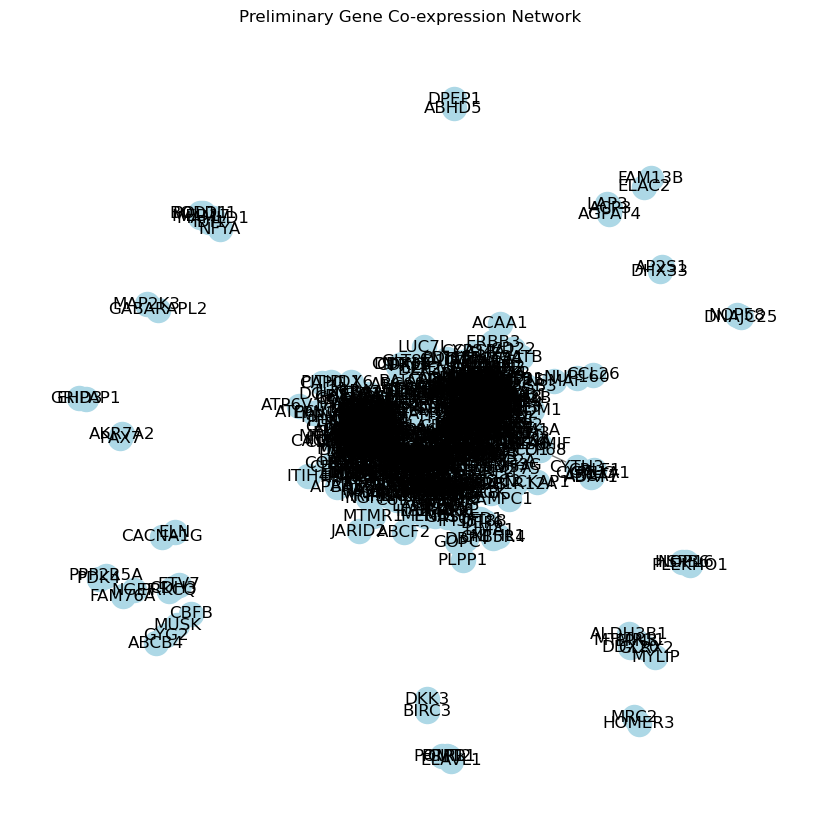

In [70]:
# Selecting a soft-thresholding power, this is usually done through analysis of the scale-free fit index
# For demonstration, we will assume a power of 6
# power = 6
# adjacency_matrix = np.power(correlation_matrix, power)

# Creating a networkx graph from the adjacency matrix

G = nx.from_numpy_array(adjacency_matrix.to_numpy())

# Relabel nodes to correspond to gene names
G = nx.relabel_nodes(G, dict(enumerate(correlation_matrices['original'].columns)))

# Visualizing the network
plt.figure(figsize=(8, 8))
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, node_color='lightblue', edge_color='gray')
plt.title('Preliminary Gene Co-expression Network')
plt.show()

# Please note: This is a simplistic approach. The WGCNA package in R provides much more
# sophisticated methods for network construction and module detection.


## Sparsification of complex graphs

### Based on simple metrics 

In [75]:
# Create a weighted graph from the co-expression matrix
G = nx.Graph()
for i in coexpression_matrix.index:
    for j in coexpression_matrix.columns:
        if i != j:
            weight = coexpression_matrix.loc[i, j]
            G.add_edge(i, j, weight=weight)

# Check if the edges now have weights and print some edge data
print("Sample edges with weights after reassignment:")
for u, v, d in list(G.edges(data=True))[:10]:
    print(u, v, d)

# Extract weights of all edges for the updated graph
weights = [d['weight'] for u, v, d in G.edges(data=True)]

Sample edges with weights after reassignment:
AASS ABCA7 {'weight': 0.5227282436106547}
AASS ABCB4 {'weight': 0.42344405162454296}
AASS ABCC2 {'weight': 0.29627757570789937}
AASS ABCC8 {'weight': 0.5083611929291945}
AASS ABCF2 {'weight': 0.27362070569022134}
AASS ABHD5 {'weight': 0.397988224082234}
AASS ACAA1 {'weight': 0.4915320590618716}
AASS ACP3 {'weight': 0.45526261782753646}
AASS ACSL4 {'weight': 0.45234938851952755}
AASS ACSM3 {'weight': 0.5487191295119167}


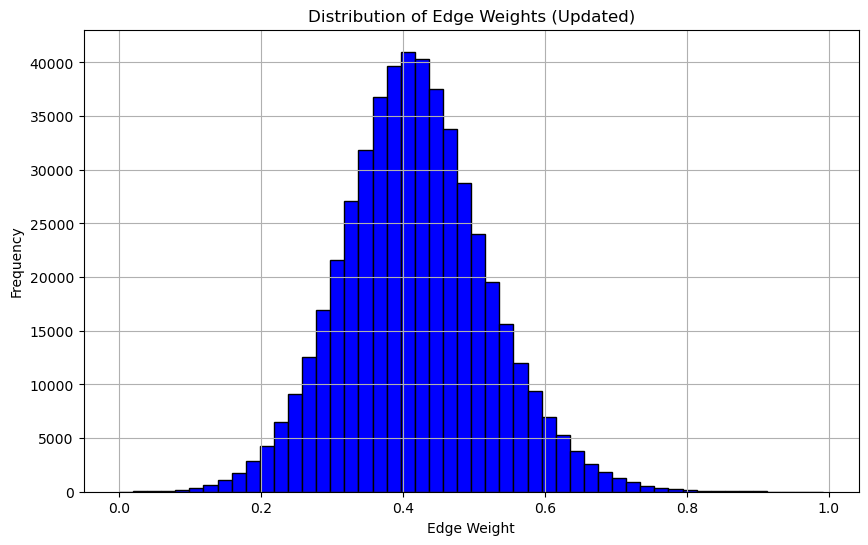

In [76]:

# Plot the distribution of weights for the updated graph
plt.figure(figsize=(10, 6))
plt.hist(weights, bins=50, color='blue', edgecolor='black')
plt.xlabel('Edge Weight')
plt.ylabel('Frequency')
plt.title('Distribution of Edge Weights (Updated)')
plt.grid(True)
plt.show()

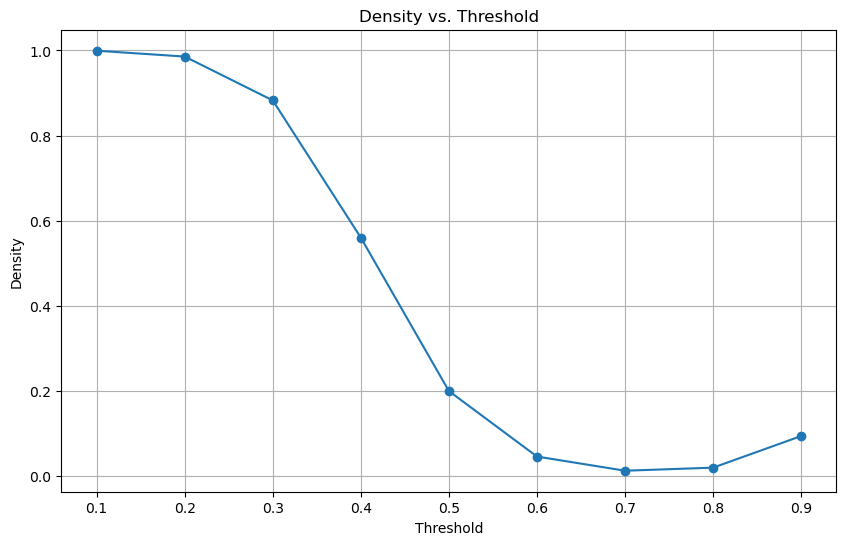

In [77]:
import matplotlib.pyplot as plt
import networkx as nx

# Function to calculate density for a series of thresholds
def analyze_density(graph, thresholds):
    densities = []
    for threshold in thresholds:
        filtered_edges = [(u, v) for u, v, d in graph.edges(data=True) if d['weight'] > threshold]
        temp_graph = nx.Graph()
        temp_graph.add_edges_from(filtered_edges)
        densities.append(nx.density(temp_graph))
    return densities

# Define the range of thresholds to analyze
thresholds = [i * 0.1 for i in range(1, 10)]  # Example: thresholds from 0.1 to 0.9

# Calculate densities for the original graph at different thresholds
densities = analyze_density(G, thresholds)

# Plot the densities
plt.figure(figsize=(10, 6))
plt.plot(thresholds, densities, marker='o')
plt.xlabel('Threshold')
plt.ylabel('Density')
plt.title('Density vs. Threshold')
plt.grid(True)
plt.show()

In [79]:


# Define the sparsification functions
def remove_by_closeness(graph, threshold=0.6):
    closeness = nx.closeness_centrality(graph)
    # Create a copy to modify
    modified_graph = graph.copy()
    for gene, centrality in closeness.items():
        if centrality < threshold:
            modified_graph.remove_node(gene)
    return modified_graph

def remove_by_degree(graph, min_degree=7):
    degrees = dict(graph.degree())
    # Create a copy to modify
    modified_graph = graph.copy()
    for gene, degree in degrees.items():
        if degree < min_degree:
            modified_graph.remove_node(gene)
    return modified_graph

# Initialize a dictionary to store graphs
graphs = {}
graphs['original'] = G.copy()  # Store the original graph

# Sparsification by weight threshold
chosen_threshold = 0.5  # Choose an appropriate threshold based on the density plot
filtered_edges = [(u, v) for u, v, d in G.edges(data=True) if d['weight'] > chosen_threshold]
graphs['threshold_0.5'] = nx.Graph()
graphs['threshold_0.5'].add_edges_from(filtered_edges)

# Sparsification by top percentage of weights
top_percentage = 10  # Top 10%
sorted_edges = sorted(G.edges(data=True), key=lambda x: x[2]['weight'], reverse=True)
top_edges_count = int(len(sorted_edges) * (top_percentage / 100))
graphs['top_10_percent'] = nx.Graph()
graphs['top_10_percent'].add_edges_from(sorted_edges[:top_edges_count])

# Apply closeness centrality sparsification
graphs['closeness_below_0.3'] = remove_by_closeness(G, threshold=0.3)

# Apply degree sparsification
graphs['degree_below_3'] = remove_by_degree(G, min_degree=3)


In [60]:
graphs['degree_below_3']

# TODO: density (networkx function) for a series of threshold, plot it and move on based on that
## check networkxs dedensification method

def display_graphs(graph_dict):
    pos = nx.spring_layout(graph_dict['original'], k=2)  # k=2 for more spaced out layout
    
    for name, graph in graph_dict.items():
        plt.figure(figsize=(15, 15))
        # Draw the graph using the specified options
        nx.draw(graph, pos=pos, with_labels=True, node_size=100,
                edge_color='gray', node_color='lightblue', width=0.5)
        plt.title(name)
        plt.show()

display_graphs(graphs)

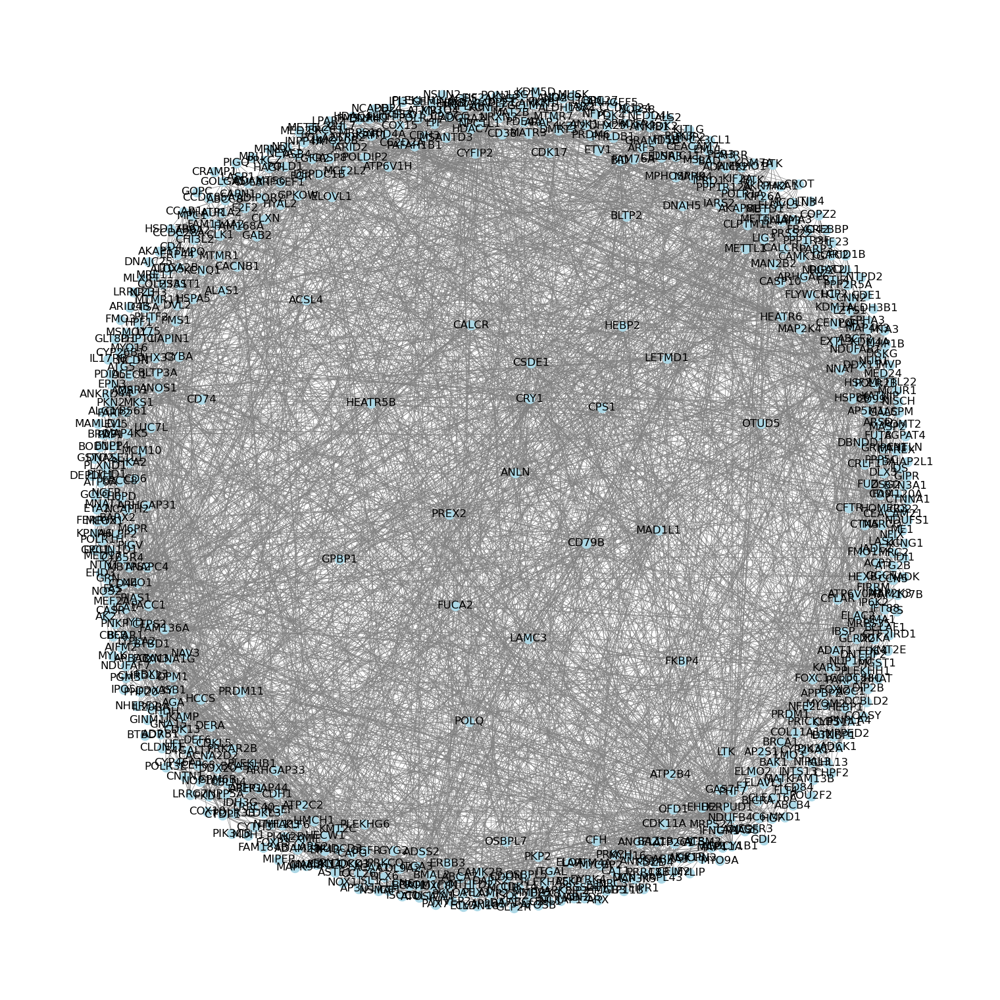

In [62]:
# draw the network with a force directed layout specify plot size and node size and thin light gray edges
plt.figure(figsize=(15,15))

nx.draw(graphs['original'], pos=nx.spring_layout(G,k=2), with_labels=True,node_size=100,edge_color='gray',node_color='lightblue',width=0.5)

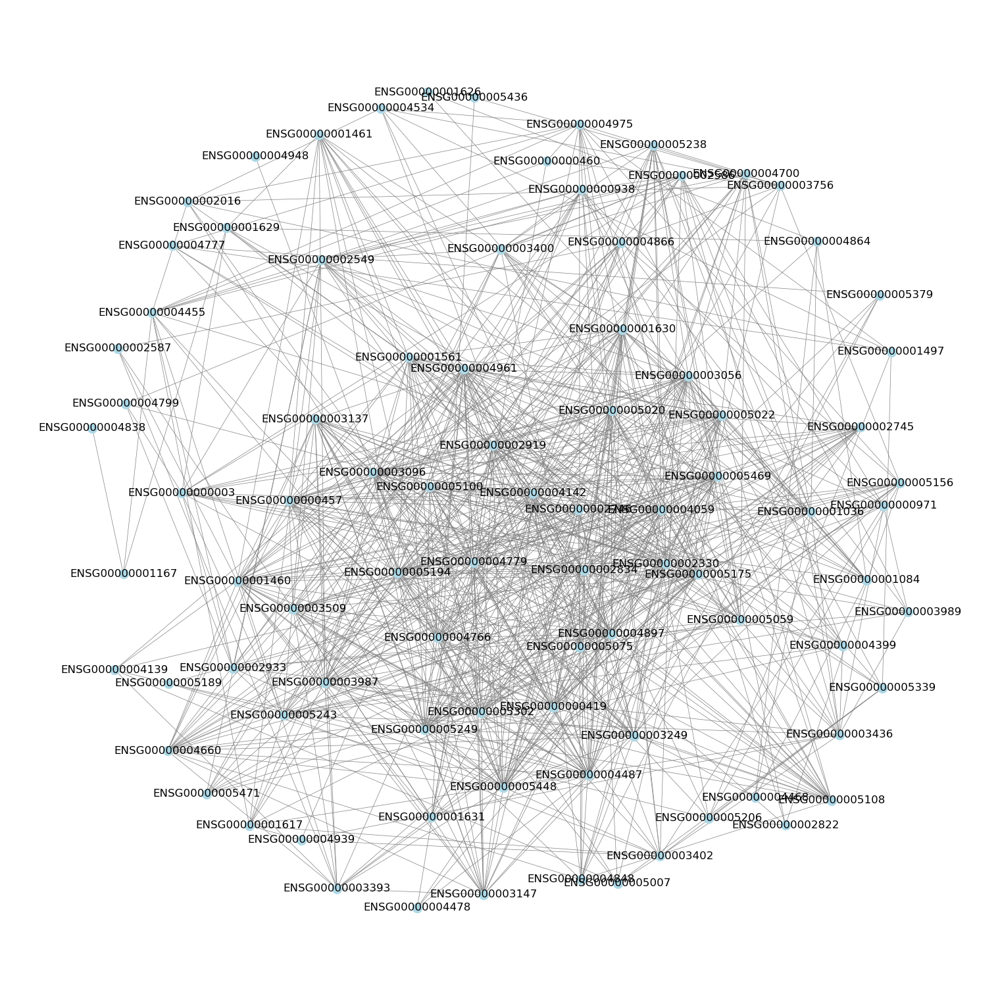

In [42]:
plt.figure(figsize=(15,15))
nx.draw(graphs['threshold_0.5'], pos=nx.spring_layout(G,k=2), with_labels=True,node_size=100,edge_color='gray',node_color='lightblue',width=0.5)


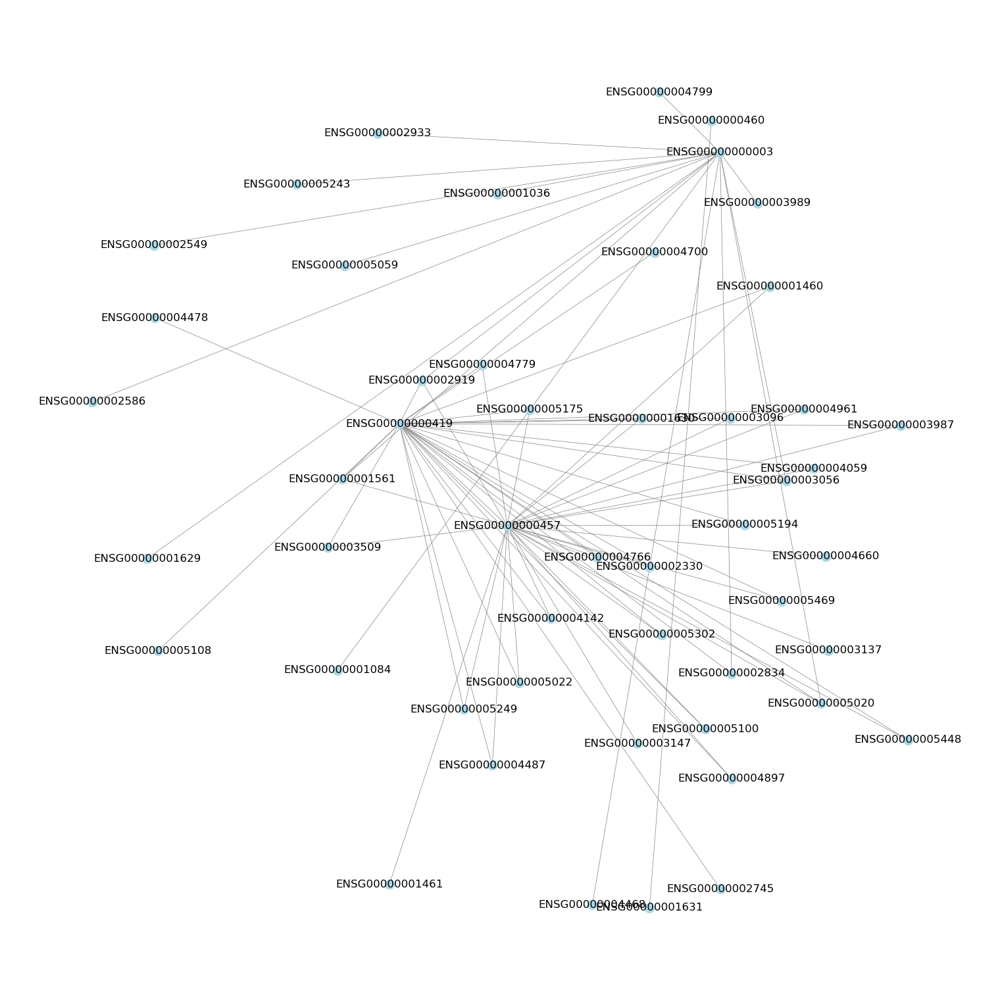

In [43]:
plt.figure(figsize=(15,15))
nx.draw(graphs['top_10_percent'], pos=nx.spring_layout(G,k=2), with_labels=True,node_size=100,edge_color='gray',node_color='lightblue',width=0.5)

In [18]:

# To iterate over all matrices and print them
for name, matrix in correlation_matrices.items():
    print(f"\n{name} Correlation Matrix:")
    print(matrix)


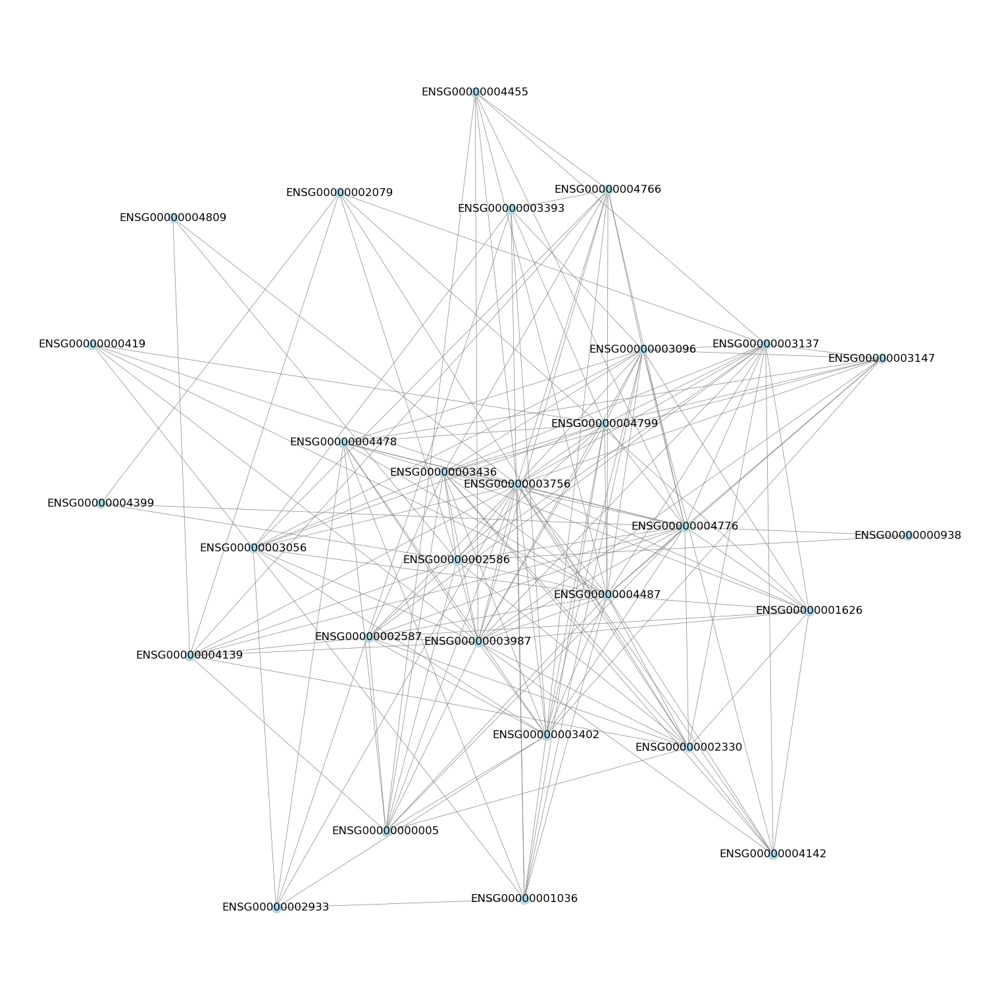

In [19]:
# draw the network with a force directed layout specify plot size and node size and thin light gray edges
plt.figure(figsize=(15,15))
nx.draw(G, pos=nx.spring_layout(G,k=2), with_labels=True,node_size=100,edge_color='gray',node_color='lightblue',width=0.5)

# Bicorr and KNN

In [66]:
def get_k_neighbours(df , k) : 
    k_neighbours = {}
    if abs(df.max().max()) > 1 : 
        print('Dataframe should be a similarity matrix of max value 1')
    else:
        np.fill_diagonal(df.values , 1)
        for node in df.index : 
            neighbours = df.loc[node].nlargest(k+1).index.to_list()[1:] #Exclude the node itself
            k_neighbours[node] = neighbours
        
    return k_neighbours

def plot_knn_network(df , K , labels , node_colours = ['skyblue'] , node_size = 300) : 
    # Get K-nearest neighbours for each node
    k_neighbours = get_k_neighbours(df , k = K)
    
    # Create a NetworkX graph
    G = nx.Graph()
    
        # Add nodes to the graph
    G.add_nodes_from(df.index)

    # Add edges based on the k-nearest neighbours
    for node, neighbours in k_neighbours.items():
        for neighbor in neighbours:
            G.add_edge(node, neighbor)

    plt.figure(figsize=(10, 8))
    nx.draw(G, with_labels=False, font_weight='bold', node_size=node_size, node_color=node_colours, font_size=8)
    
    return G

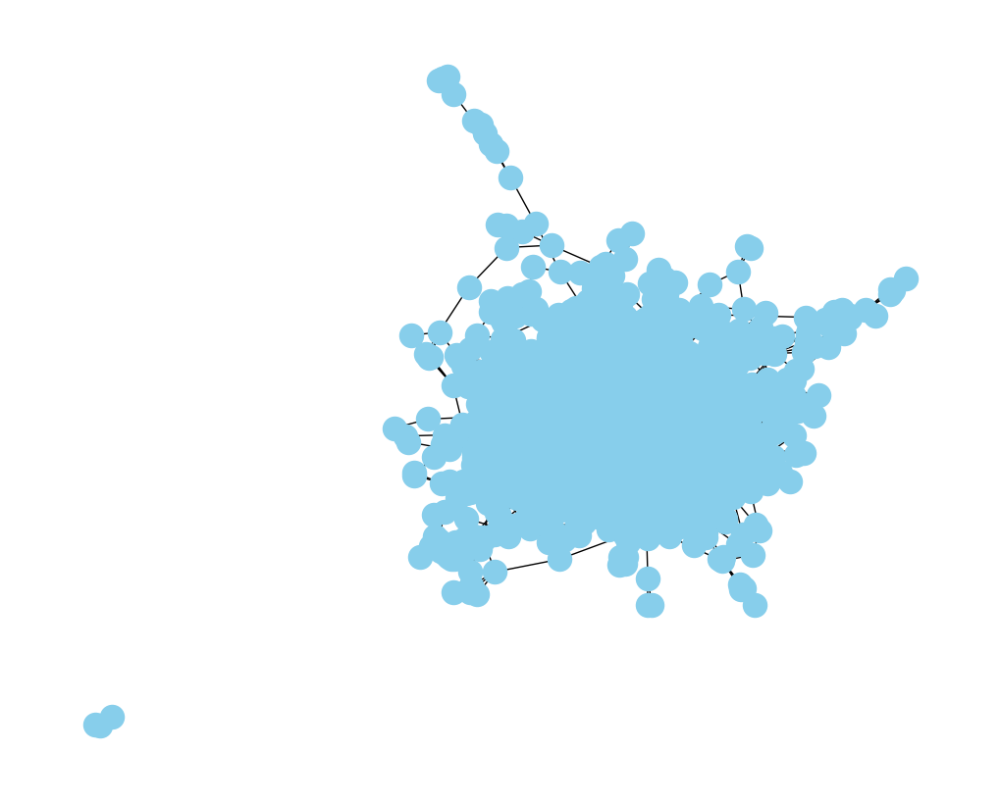

In [67]:
graphs['top_10_percent']
# Ensure the values are between 0 and 1 (if using a similarity measure that ranges between 0 and 1, like correlation)
coexpression_matrix = (correlation_matrices['original'] - correlation_matrices['original'].min().min()) / (correlation_matrices['original'].max().max() - correlation_matrices['original'].min().min())

# Define the number of nearest neighbors
K = 2

# Optionally, create a dictionary for node labels
labels = { 'Gene1': 'Gene 1', 'Gene2': 'Gene 2', 'Gene3': 'Gene 3', 'Gene4': 'Gene 4' }

# Plot the KNN network
G = plot_knn_network(coexpression_matrix, K, labels)

In [55]:
def apply_knn_sparsification(G, k=5, mode='distance'):
    """
    Apply kNN sparsification to the graph G.
    :param G: A NetworkX graph where edges have a 'weight' attribute.
    :param k: The number of nearest neighbors to retain for each node.
    :param mode: 'distance' (smaller is closer) or 'similarity' (larger is closer).
    """
    # Create a new graph to store the sparsified version
    sparsified_graph = nx.Graph()
    
    # Iterate over all nodes and apply kNN selection
    for node in G.nodes():
        neighbors = list(G[node].items())  # Get all neighbors and their edge data
        # Sort neighbors according to weight, which could represent distance or similarity
        if mode == 'distance':
            # For distance, closer neighbors have smaller weights; keep the smallest
            neighbors.sort(key=lambda x: x[1]['weight'])
            chosen_neighbors = neighbors[:k]  # Pick k smallest
        elif mode == 'similarity':
            # For similarity, closer neighbors have larger weights; keep the largest
            neighbors.sort(key=lambda x: x[1]['weight'], reverse=True)
            chosen_neighbors = neighbors[:k]  # Pick k largest

        # Add edges from the node to its k-nearest neighbors
        for neighbor, edge_data in chosen_neighbors:
            sparsified_graph.add_edge(node, neighbor, weight=edge_data['weight'])

    return sparsified_graph

# Example usage:
# Assuming 'G' is your original graph and each edge has a 'weight' attribute
k = 3  # Number of neighbors
sparsified_G = apply_knn_sparsification(G, k, mode='distance')  # Adjust mode based on your data


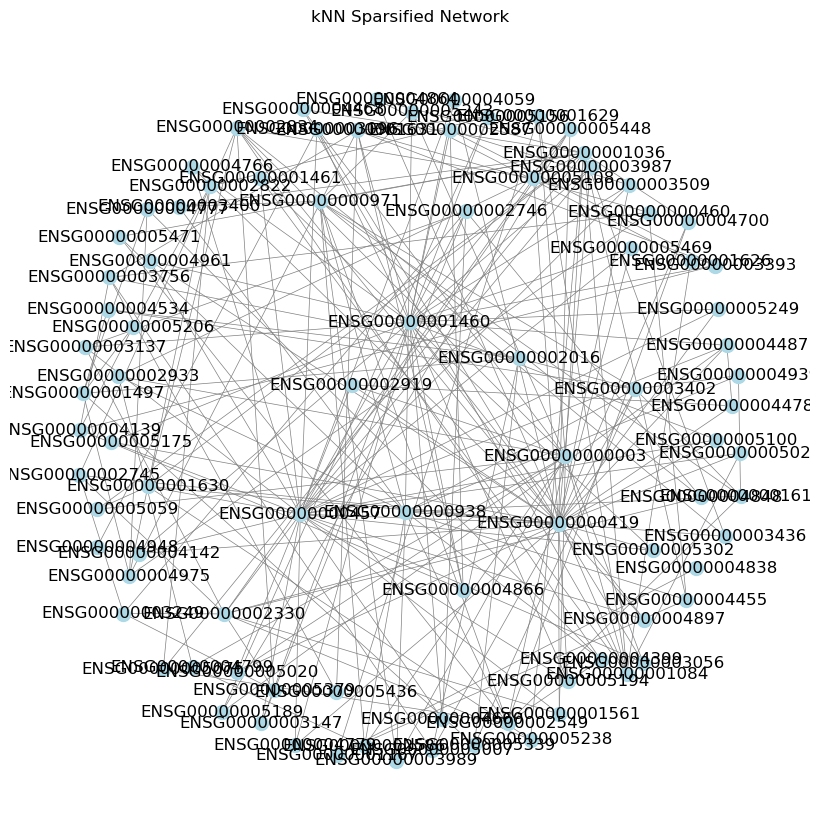

In [57]:
pos = nx.spring_layout(sparsified_G, k=2)  # k=2 increases the space between nodes

# Now, draw the graph with the specified node and edge aesthetics
plt.figure(figsize=(8, 8))
nx.draw(sparsified_G, pos, with_labels=True, node_size=100,
        edge_color='gray', node_color='lightblue', width=0.5)
plt.title("kNN Sparsified Network")
plt.show()

In [29]:
## Autism Spectrum Disorder data

data = pd.read_csv(r"C:\cdt_data\ASD_magdalena\DS_10283_3827\RNASeq\RNASeq\RNAseq_ASD_datExpr.csv")

data.rename(columns={'Unnamed: 0': 'Patient_ID'}, inplace=True)

# data = data.head(100)

# Transpose the data so that genes are columns and rows are observations
data = data.set_index('Patient_ID').T
# data = data.iloc[:, :1000]


In [30]:
data

Patient_ID,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000273489,ENSG00000273490,ENSG00000273491,ENSG00000273492,ENSG00000273493,__no_feature,__ambiguous,__too_low_aQual,__not_aligned,__alignment_not_unique
01_052914,63,1,105,284,72,24,159,155,715,488,...,4,0,0,68,3,12726121,324319,0,0,5842658
01_053014,73,3,172,243,39,21,139,139,682,445,...,1,0,0,31,0,11801279,277372,0,0,3951895
01_061914,100,4,127,266,55,25,71,141,669,554,...,7,0,0,70,0,18192534,314101,0,0,7507251
01_072114,80,0,85,280,63,67,154,123,526,437,...,4,0,0,23,1,19509561,231035,0,0,3863531
01_072214,72,0,146,296,50,28,433,192,642,543,...,4,0,0,31,2,11825201,285657,0,0,4125572
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41_072214,81,2,126,193,55,61,192,135,513,516,...,26,0,0,36,1,19612339,239329,0,0,4656268
41_082014,64,2,106,222,41,27,129,131,434,423,...,9,0,0,29,3,14594164,238705,0,0,3922692
45_071514,78,1,160,277,75,46,153,169,690,580,...,4,0,0,20,4,14017074,317867,0,0,6812698
13_081514,72,1,78,238,90,11,61,107,707,562,...,8,0,0,24,2,18614266,275348,0,0,7636206


In [ ]:

# Plot Heatmap of the Gene Expression Matrix
plt.figure(figsize=(14, 10))
sns.heatmap(df.iloc[:, :100].transpose(), cmap='viridis')  # Visualize first 100 genes
plt.title('Heatmap of Gene Expression (First 100 Genes)')
plt.xlabel('Samples')
plt.ylabel('Genes')
plt.show()



In [ ]:
# Calculate and plot the correlation matrix
correlation_matrix = expression_data.corr().abs()
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.title('Correlation Matrix of Gene Expression')
plt.show()

In [6]:
# Check for negative values

In [19]:
# For categorical data, you can use bar plots to visualize the frequency of each category
categorical_columns = data.select_dtypes(include=['object']).columns
for column in categorical_columns:
    plt.figure(figsize=(10, 4))
    data[column].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {column}')
    plt.show()

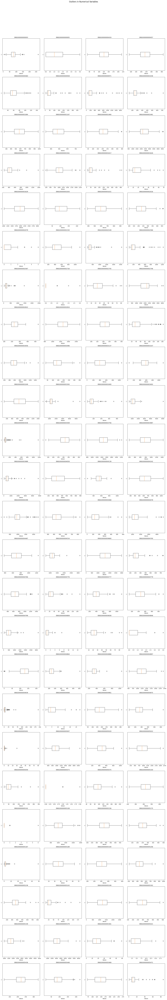

In [35]:
import matplotlib.pyplot as plt

numerical_columns = data.select_dtypes(include=['float64', 'int64'])

# Determine the number of rows and columns for the subplot grid
columns_per_row = 4  # Number of columns in each row of subplots
num_columns = len(numerical_columns.columns)
num_rows = (num_columns // columns_per_row) + (num_columns % columns_per_row > 0)

# Create a figure with subplots in a grid
fig, axes = plt.subplots(num_rows, columns_per_row, figsize=(20, 5 * num_rows))
fig.suptitle('Outliers in Numerical Variables', fontsize=16)

# Flatten axes array to simplify the loop logic
axes = axes.flatten()

for i, col in enumerate(numerical_columns.columns):
    # Plot boxplot for each column
    axes[i].boxplot(data[col].dropna(), vert=False)  # 'vert=False' makes the boxplot horizontal
    axes[i].set_title(col)
    axes[i].set_xlabel('Values')

# Hide unused axes if the number of plots isn't a perfect multiple of the number of columns per row
if num_columns % columns_per_row:
    for ax in axes[num_columns:]:
        ax.set_visible(False)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the suptitle
plt.show()

In [41]:
data = data.iloc[:, :10000]

AttributeError: 'dict' object has no attribute 'iloc'

In [5]:
data = expression_data

## Generation Scotland

In [ ]:
with open('../ISMB_GS_Data.pkl' , 'rb') as file : 
    loaded_data = pd.read_pickle(file)

In [ ]:
w1 = loaded_data['DNAm_w1'].dropna()
w3 = loaded_data['DNAm_w3'].dropna()
phenotypes = loaded_data['Phenotypes']

In [ ]:
# Setting Up the Programming Environment
# %pip install networkx

# import modules for use in the notebook

# handling www based requests (like APIs)
import urllib as ul

# standard Python data handling modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json

# working with networks
import networkx as nx

# Setting up PIP network using String

In [ ]:
# create a concatenated list of gene names as strings
# note we are taking gene names from the 'gene' column of the dataframe we obtained from the EWAS catalog and filtered
# to common CpG and Gene sites above. The join function then concatenates them using the '%0D' string
# to stitch them all together. This string will be used to help us build the API query URL.
external_gene_names = '%0D'.join(map(str,df_filt['gene'].iloc[:300].drop_duplicates()))

# pass the list of Gene Names to the String-DB API return the String-IDs
# we first form the query url using the 'get_string_ids' API function which takes a list of identifiers and
# converts them into the internal String-DB accession IDs. This massively speeds up the search and allows us to
# search for more than 10 at once which is an API restriction for other API functions if String-DB internal accessions 
# aren't used.
query_url = 'https://string-db.org/api/tsv-no-header/get_string_ids?identifiers='+external_gene_names+'&species=9606&format=only-ids'

# use the urllib library to retrieve the String-DB internal IDs
result = ul.request.urlopen(query_url).read().decode('utf-8')

# now we want to query String-DB to retrieve interactions from this list of String-DB IDs
# we create a concatenated list of stringdbIDs in much the same way as above for the Entrez Gene IDs
stringdbIDs = '%0D'.join(result.splitlines())

# again we build the query for interactions using the String-DB IDs
query_url = 'https://string-db.org/api/tsv/network?identifiers='+stringdbIDs+'&species=9606'

# again using urllib to retrieve the interactions these are returned in a standard tab delimied text format
interactions = ul.request.urlopen(query_url).read().decode('utf-8').splitlines()

# we need to split the result by these 'tabs' (\t - is used to identfy them)
int_test = [interaction.split('\t') for interaction in interactions]

# we extract the field names from the first row
column_names = int_test[:1][0]

# create a Pandas dataframe of the interaction data we have just retrieved from String-DB
interactions_df = pd.DataFrame(int_test,columns=column_names)

# delete the first row that held the fieldnames but we no longer need
interactions_df = interactions_df.drop(labels=0,axis=0)

# remove any duplicate rows
final_interactions = interactions_df.drop_duplicates()

# show the top of the protein-protein interaction table
final_interactions.head()